# Basis of Investigation
After talking with jovo on Saturday night, we decided on 3 different branches of investigation for the registration issue:

1. Binary Mask Matching
2. Centroid Matching
3. Graph Matching

The intent of this notebook is to investigate these 3 branches in an algorithms.md like scope.

# 0. Functionality Testing
Before running any investigation, I must verify that I can correctly call NDReg and its related functionalities. To do this, I will recreate the demo in its documentation notebook here:

https://github.com/neurodata/ndreg/blob/master/doc/3D_STP_RegistrationTest.ipynb

In [2]:
import sys
sys.path.insert(0, '../../../ndreg/')
sys.path.insert(0,'../code/functions/')

import ndreg
import math
import cv2
import pickle

import numpy as np
import SimpleITK as itk
import matplotlib.pyplot as plt
import plosLib as pLib
import connectLib as cLib
import connectLib as cLib

from affine import Affine
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from random import randrange as rand
from random import uniform as floatRand
from PIL import Image

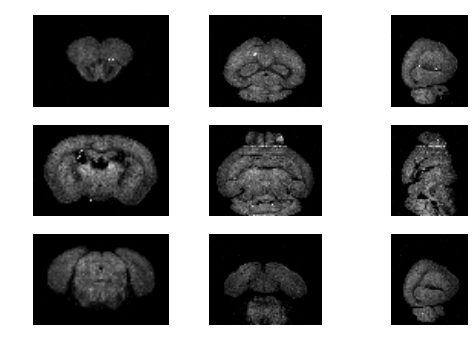

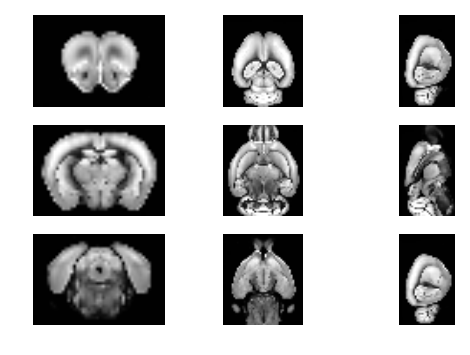

In [3]:
refImg = ndreg.imgDownload('ara_ccf2')
refAnnoImg = ndreg.imgDownload('ara_ccf2', channel="annotation")
inImg = ndreg.imgDownload('eacker01', 'r', 5)

#reorient and rescale the test image
inImgReor = ndreg.imgReorient(inImg, 'lsp', 'rsa')
inImg_ds = ndreg.imgResample(inImgReor, spacing=[.25, .25, .25])
refImg_ds = ndreg.imgResample(refImg, spacing=[.25, .25, .25])

#display the images to be registered
ndreg.imgShow(inImg_ds, vmax=10000)
ndreg.imgShow(refImg_ds, vmax=500)

In [3]:
def register(inImg, baseImg, iterations, MI=False):
    return ndreg.imgAffineComposite(inImg,
                              baseImg,
                              iterations=iterations,
                              useMI=MI,
                              verbose=False)

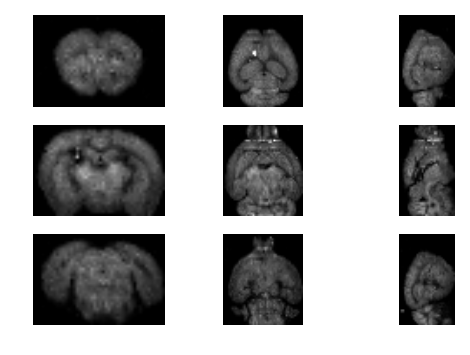

In [10]:
transform = register(inImg_ds, refImg_ds, 200, True)
resultImg = ndreg.imgApplyAffine(inImg_ds,
                                 transform,
                                 size=refImg_ds.GetSize(),
                                 spacing=refImg_ds.GetSpacing())
                                
ndreg.imgShow(resultImg, vmax=10000)

The above image is consistant with the results in the documentation; thus, it is safe to say that the NDReg library can be called functionally.

# 1. Test Methods and Data
In this section, I will create and demonstrate the functionality of all methods that will be used to test the registration techniques

## A. Random Small Transformation Function
The funtions below should be able to generate a bounded random rigid transform, and apply that transform to a body

In [4]:
def getTransform(pitchRange = .1,
                 rollRange = .1,
                 yawRange = .1,
                 xRange = 0.,
                 yRange = 0.,
                 zRange = 0.,
                 pitch=None,
                 yaw=None,
                 roll=None,
                 zT=None,
                 yT=None,
                 xT=None):
    
    #generate a random rigid body transform in given bounds
    a = floatRand(pitchRange-(pitchRange/2.), pitchRange+(pitchRange/2.))
    b = floatRand(yawRange-(yawRange/2.), yawRange+(yawRange/2.))
    c = floatRand(rollRange-(rollRange/2.), rollRange+(rollRange/2.))

    xt = floatRand(xRange-(xRange/2.), xRange+(xRange/2.))
    yt = floatRand(yRange-(yRange/2.), yRange+(yRange/2.))
    zt = floatRand(zRange-(zRange/2.), zRange+(zRange/2.))

    #set default params, if passed
    if yaw is not None:
        a = yaw
    if pitch is not None:
        b = pitch
    if roll is not None:
        c = roll 
    if xT is not None:
        xt = xT
    if yT is not None:
        yt = yT
    if zT is not None:
        zt = zT

    #generate the transform
    transform = np.stack([
        [math.cos(a)*math.cos(b), math.cos(a)*math.sin(b)*math.sin(c)-math.sin(a)*math.cos(c), math.cos(a)*math.sin(b)*math.cos(c)+math.sin(a)*math.sin(c), xt],
        [math.sin(a)*math.cos(b), math.sin(a)*math.sin(b)*math.sin(c)+math.cos(a)*math.cos(c), math.sin(a)*math.sin(b)*math.cos(c)-math.cos(a)*math.sin(c), yt],
        [-math.sin(b), math.cos(b)*math.sin(c), math.cos(b)*math.cos(c), zt],
        [0., 0., 0., 1.]
    ])
    return transform
    
    
def applyRigid(initialVolume, transform, verbose=False):
    #create a body to hold return values
    rigidMatrix = np.zeros_like(initialVolume)  
    
    #create vars to keep track of out of bounds percent
    out = 0.
    
    #convert every voxel
    for z in range(initialVolume.shape[0]):
        for y in range(initialVolume.shape[1]):
            for x in range(initialVolume.shape[2]):
                
                #shift the volume so that the transform is applied to the center, and not the top left back edge
                shift = [initialVolume.shape[2]/2., initialVolume.shape[1]/2., initialVolume.shape[0]/2.]
                shiftedPoint = list(np.subtract([x, y, z], shift))
                shiftedPoint.append(1.)
                
                #calculate the transform, drop the irrelavent 1 at the end
                new = np.dot(transform, shiftedPoint)[:3]
                
                #shift the volume back to its original spot after transform
                final = np.add(new, shift)
                
                #attempt to assign new spot
                try:
                    rigidMatrix[int(final[2]), int(final[1]), int(final[0])] = initialVolume[z, y, x]
                    
                #if transformed place is out of bounds, dont assign it
                except IndexError:
                        out+=1.
                        continue
    #print information, if required
    if verbose:
        print 'Out of bounds fraction: ', out/float(initialVolume.shape[0]*initialVolume.shape[1]*initialVolume.shape[2])
    
    return rigidMatrix

In order to test this function, I will be applying known transformations to it via the default params, and visually verifying the results. The following image will be stacked in a volume in order to test this functionality:

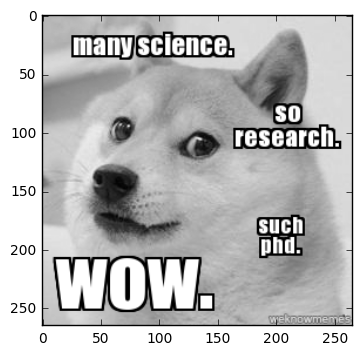

In [5]:
testImg = cv2.imread('../code/tests/synthDat/testImg.jpg', 0)
testVol = np.stack([testImg for i in range(256)])
plt.imshow(testVol[128], cmap='gray')
plt.show()

Out of bounds fraction:  0.00383254716981


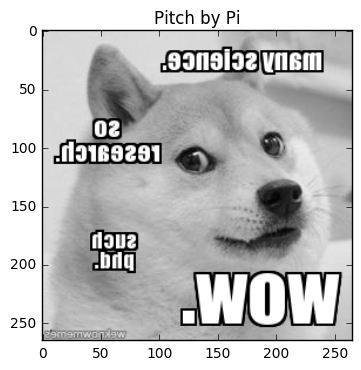

In [76]:
#demonstrate simple rotations and translations
transform = getTransform(pitch=3.14, yaw=0., roll=0., xT=0., yT=0., zT=0.)
newVol = applyRigid(testVol, transform, verbose=True)
fig = plt.figure()
plt.title('Pitch by Pi')
plt.imshow(newVol[128], cmap='gray')
plt.show()

Out of bounds fraction:  0.00377358490566


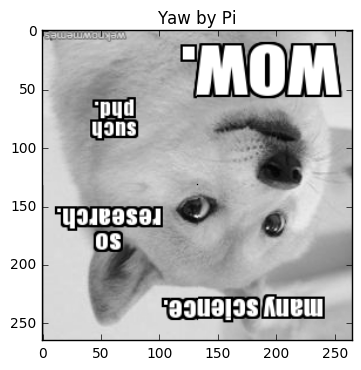

In [78]:
transform = getTransform(pitch=0., yaw=3.14, roll=0., xT=0., yT=0., zT=0.)
newVol = applyRigid(testVol, transform, verbose=True)
fig = plt.figure()
plt.title('Yaw by Pi')
plt.imshow(newVol[128], cmap='gray')
plt.show()

Out of bounds fraction:  0.00383254716981


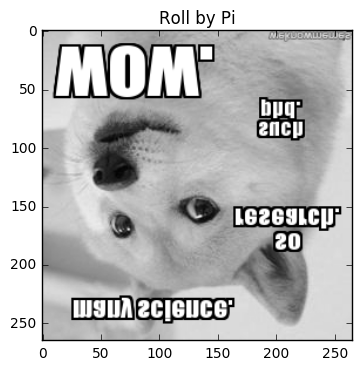

In [26]:
transform = getTransform(pitch=0., yaw=0., roll=3.14, xT=0., yT=0., zT=0.)
newVol = applyRigid(testVol, transform, verbose=True)
fig = plt.figure()
plt.title('Roll by Pi')
plt.imshow(newVol[128], cmap='gray')
plt.show()

Out of bounds fraction:  0.0377358490566


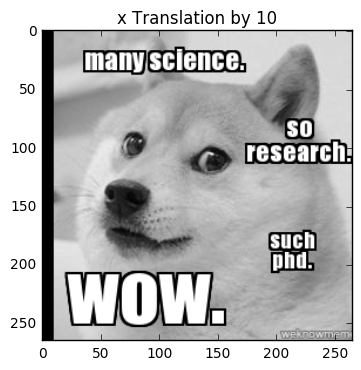

In [27]:
transform = getTransform(pitch=0., yaw=0., roll=0., xT=10., yT=0., zT=0.)
newVol = applyRigid(testVol, transform, verbose=True)
fig = plt.figure()
plt.title('x Translation by 10')
plt.imshow(newVol[128], cmap='gray')
plt.show()

Out of bounds fraction:  0.0377358490566


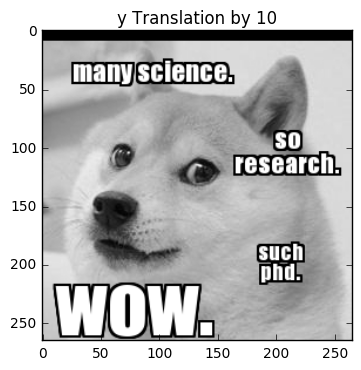

In [28]:
transform = getTransform(pitch=0., yaw=0., roll=0., xT=0., yT=10., zT=0.)
newVol = applyRigid(testVol, transform, verbose=True)
fig = plt.figure()
plt.title('y Translation by 10')
plt.imshow(newVol[128], cmap='gray')
plt.show()

Out of bounds fraction:  0.0390625


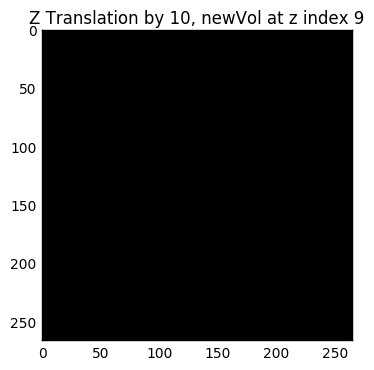

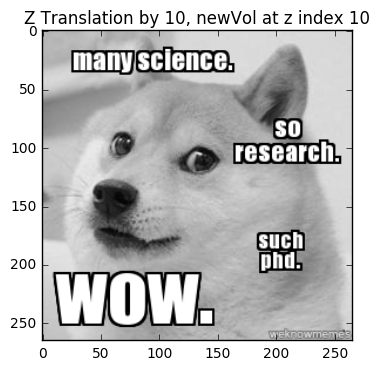

In [31]:
transform = getTransform(pitch=0., yaw=0., roll=0., xT=0., yT=0., zT=10.)
newVol = applyRigid(testVol, transform, verbose=True)
fig = plt.figure()
plt.title('Z Translation by 10, newVol at z index 9')
plt.imshow(newVol[9], cmap='gray')
plt.show()
plt.title('Z Translation by 10, newVol at z index 10')
plt.imshow(newVol[10], cmap='gray')
plt.show()

The above images confirm the functionality of the transform and applyRigid functions. Thus, they can be safely used for testing

## B. Test Data
For some reason, jupyter does not like loading the tiff files directly from our tiffIO driver. Due to this, I have pickled a the true data from time point 1 to be loaded in to jupyter. That data is loaded and displayed below

In [6]:
realData = pickle.load(open('../code/tests/synthDat/realDataRaw_t0.synth', 'r'))
print realData.shape

(280, 1024, 1024)


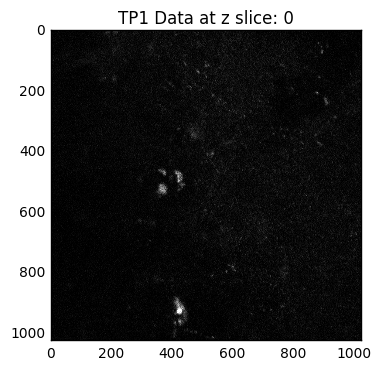

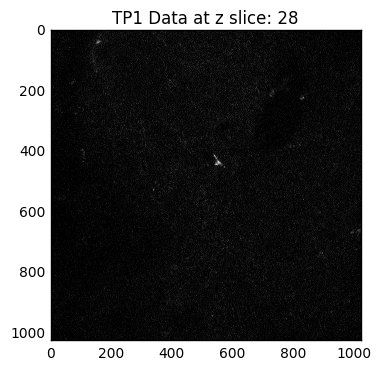

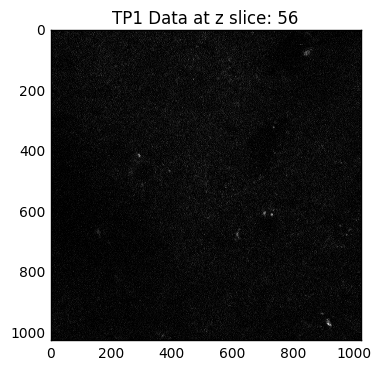

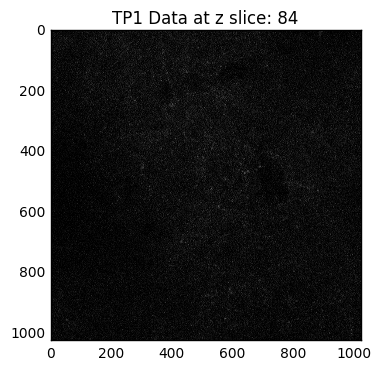

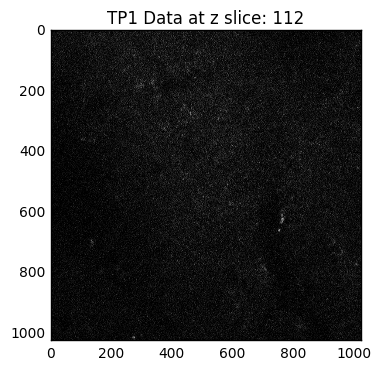

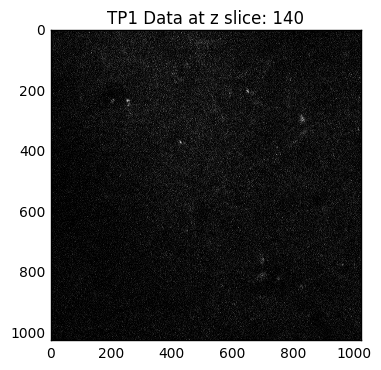

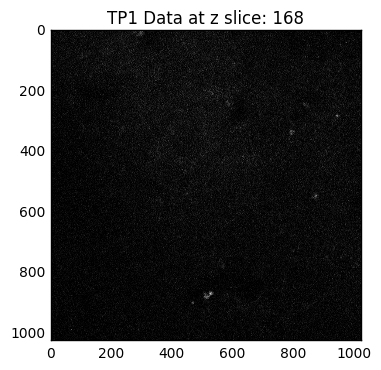

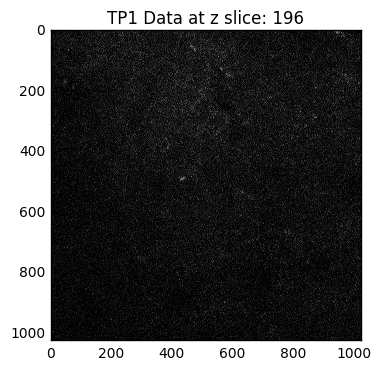

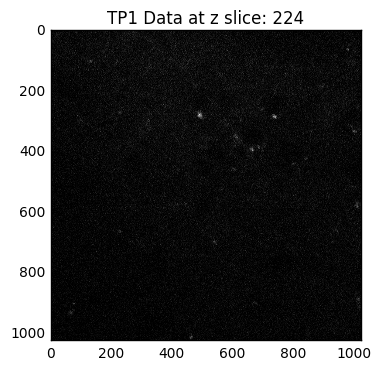

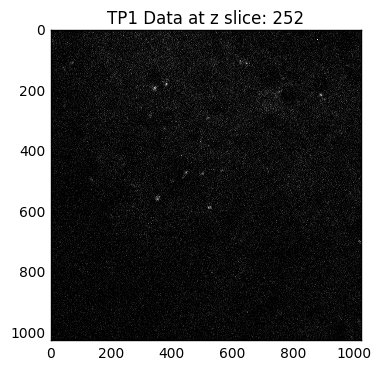

In [5]:
#will display every 28th slice of the data
for i in range(10):
    plt.title('TP1 Data at z slice: ' + str(i*28))
    plt.imshow(realData[i*28], cmap='gray')
    plt.show()

In order to expediate testing, the following 7 slice data portion will be used for all tests. 7 slices were selected due to the pipeline throwing out the top and bottom slices due to ill defined filter operations. This will leave a (5, 1024, 1024) volume.

(7, 1024, 1024)


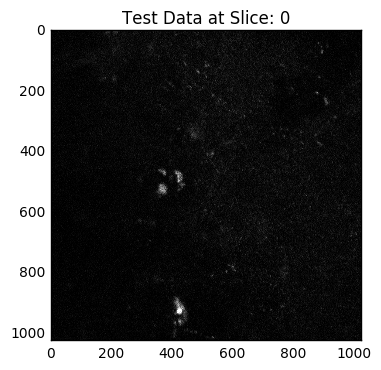

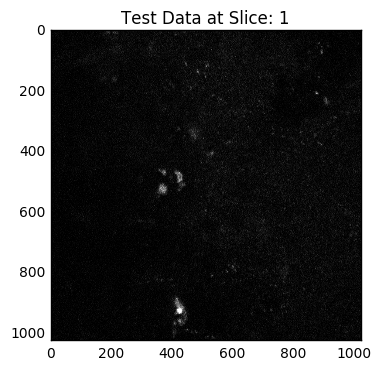

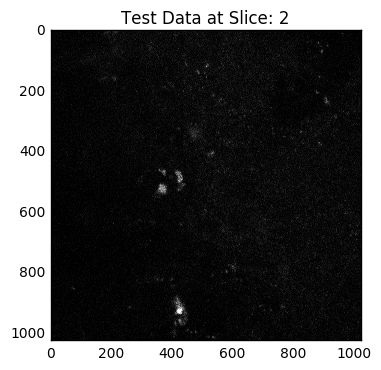

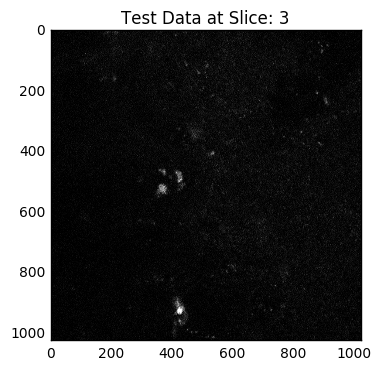

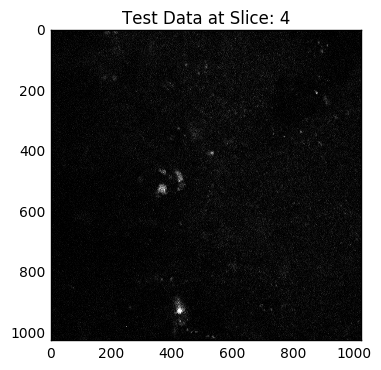

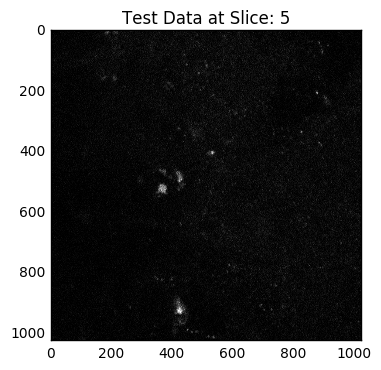

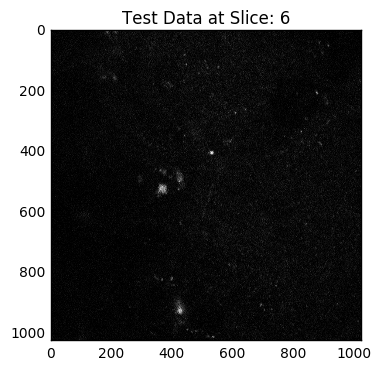

In [7]:
testData = realData[:7]
print testData.shape
for i in range(0, 7):
    fig = plt.figure()
    plt.title('Test Data at Slice: ' + str(i))
    plt.imshow(testData[i], cmap='gray')
    plt.show()

## C. Transformation Visualization Function
The goal of this function is to provide viewers with an intuitive way to visualize the random transformations

In [8]:
def visualizeTransform(transform):
    dat = np.zeros((20, 20, 20))
    for i in range(9, 12):
        for j in range(9, 12):
            for k in range(9, 12):
                dat[i][j][k] = 1.
    applyRigid(dat, transform, False)
    fig = plt.figure()
    plt.title('Transformation Visualization')
    ax = fig.add_subplot(111, projection='3d')
    z, y, x = dat.nonzero()
    ax.scatter(x, y, z, zdir='z', c='r')
    plt.show()

[[ 0.89940424 -0.31576873  0.30226169  0.        ]
 [ 0.39749401  0.87850117 -0.26501738  0.        ]
 [-0.18185305  0.35850496  0.91564385  0.        ]
 [ 0.          0.          0.          1.        ]]


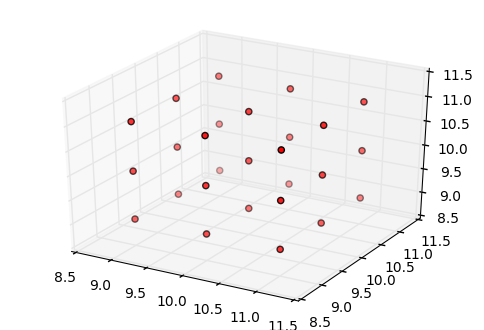

In [68]:
transform = getTransform()
print transform
visualizeTransform(transform)

# D. Disparity Visualization
The point of this function is to allow for the visualization of disparities in images before and after registration

In [56]:
def toDiff(imgA, imgB):
    ret = np.empty((imgA.shape[0], imgA.shape[1], 3), dtype=np.uint8)
    for y in range(imgA.shape[0]):
        for x in range(imgA.shape[1]):
            
            if imgA[y][x] and not imgB[y][x]:
                ret[y][x][0] = 255
                ret[y][x][1] = 0
                ret[y][x][2] = 0
            elif not imgA[y][x] and imgB[y][x]:
                ret[y][x][0] = 0
                ret[y][x][1] = 255
                ret[y][x][2] = 0
            elif imgA[y][x] and imgB[y][x]:
                ret[y][x][0] = 255
                ret[y][x][1] = 255
                ret[y][x][2] = 0
            else:
                ret[y][x][0] = 255
                ret[y][x][1] = 255
                ret[y][x][2] = 255
            
    return ret

def visDiff(sliceA, sliceB):
    disp = toDiff(sliceA, sliceB)
    return disp

## E. Test Execution Function
The purpose of this function is, when given two arrays, to run an NDReg test on them and report statistics on the success of said test

In [59]:
def executeTest(testImg, baseImg, gradientIterations = 200, verbose=True, display=False):
    
    initialErr = np.sum((np.subtract(baseImg, testImg))**2)
    
    testImgITK = itk.GetImageFromArray(testImg)
    baseImgITK = itk.GetImageFromArray(baseImg)
    
    if verbose:
        print '\tInitial Error: ', initialErr
    transform = register(testImgITK, baseImgITK, gradientIterations)
    
    if verbose:
        print '\tTransform:'
        print transform
         
    regImg = itk.GetArrayFromImage(
        ndreg.imgApplyAffine(
            testImgITK,
            transform,
            size=testImgITK.GetSize(),
            spacing=testImgITK.GetSpacing()
            )
        )
    
    finalErr = np.sum((np.subtract(baseImg, regImg))**2)
    errReductionRatio = np.subtract(initialErr, finalErr)/float(initialErr)
    
    if verbose:
        print '\tFinal Error: ', finalErr
        print '\tError Reduction Ratio: ', errReductionRatio
    
    if display:
        for i in range(testImg.shape[0]):
            fig = plt.figure()
            diff = visDiff(testImg[i], baseImg[i])seImg[2])
            plt.title('Disperity On Z Slice: ' + str(i))
            plt.imshow(diff)
            plt.show()
        
    return regImg, initialErr, finalErr, errReductionRatio    

# 2. Binary Mask Matching
There are two sub types of binary mask matching that I would like to try:

- Method 1
    1. Run volume A through PLOS pipeline
    2. Create volume B by applying small transform to volume A
    3. Attempt registration
    
- Method 2
    1. Create volume B by applying small transform to volume A
    2. Run both volume A and volume B through the PLOS pipeline
    3. Attempt to register the outputs
    
Method 2 is intuitively more difficult than method 1, in that there will be less 'true shared information' between volume A and volume B, due to noise introduced in the PLOS pipeline. Thus, Method 2 will only be investigated if Method 1 yields strong results.
    
## A. Method 1

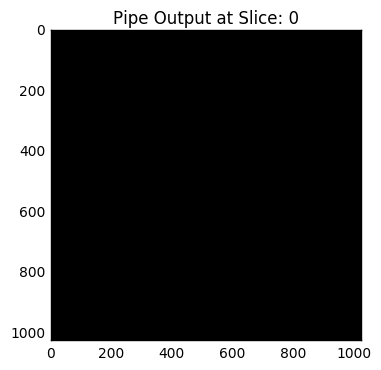

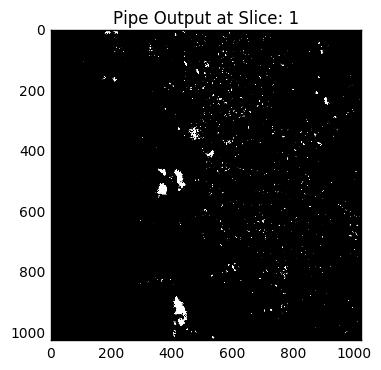

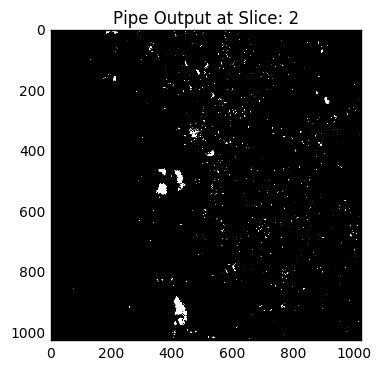

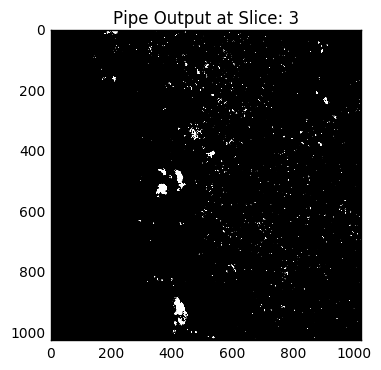

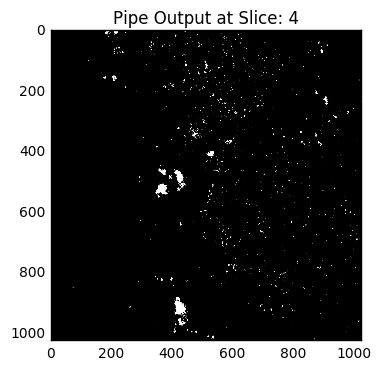

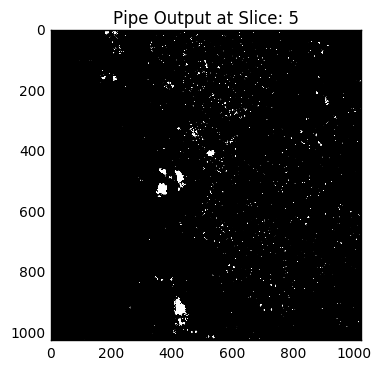

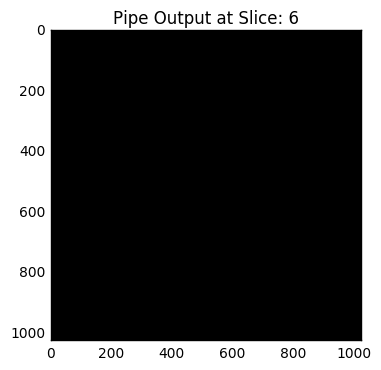

In [13]:
#get output of PLOS and Otsu
outVolume = cLib.otsuVox(pLib.pipeline(testData))
for i in range(0, 7):
    fig = plt.figure()
    plt.title('Pipe Output at Slice: ' + str(i))
    plt.imshow(outVolume[i], cmap='gray')
    plt.show()

In [14]:
#As expected, slices 0 and 6 are ill defined, so remove them
outVolume = outVolume[1:6]
print outVolume.shape

(5, 1024, 1024)


In [15]:
#generate and apply a basic transform to the output
transform = getTransform(pitch=0., yaw=.15, roll=0., xT=0., yT=0., zT=0.)
transformVolume = applyRigid(outVolume, transform, True)

Out of bounds fraction:  0.0318670272827


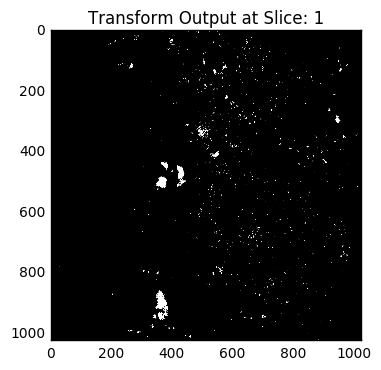

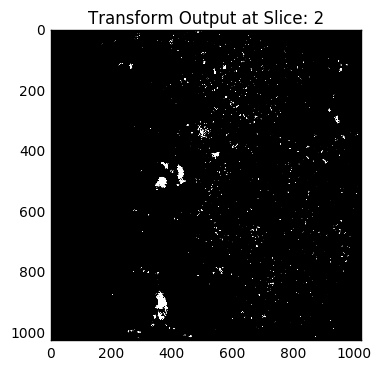

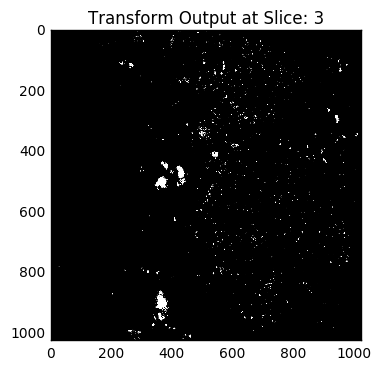

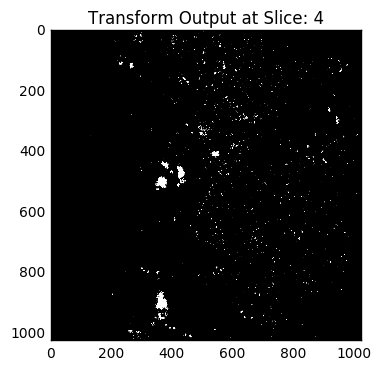

IndexError: index 5 is out of bounds for axis 0 with size 5

In [16]:
for i in range(1, 6):
    fig = plt.figure()
    plt.title('Transform Output at Slice: ' + str(i))
    plt.imshow(transformVolume[i], cmap='gray')
    plt.show()

	Initial Error:  110266.0
	Transform:
[0.9975932877997035, 0.05842507161859518, -0.05792548260651925, -0.06162104745726014, 0.9975625945148371, -0.055072088456448946, 0.054513273971632206, 0.05845168451847105, 0.9977840056493715, 0.04733375669943689, -0.053518760362313074, 0.07005213287769078]
	Final Error:  60874.0
	Error Reduction Ratio:  0.447934993561


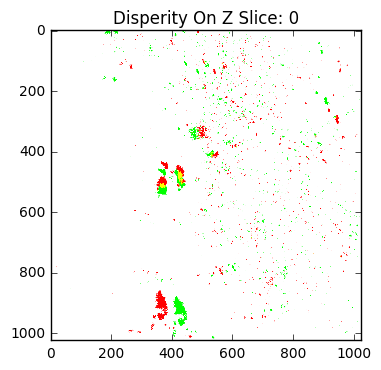

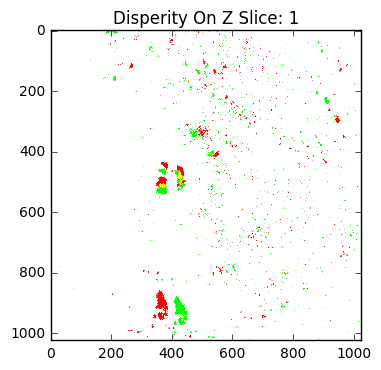

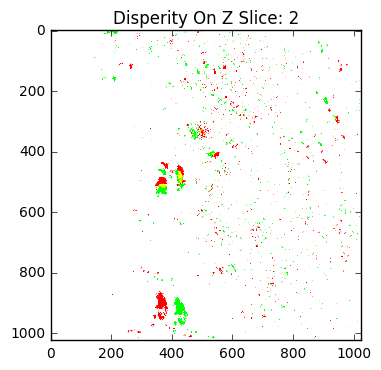

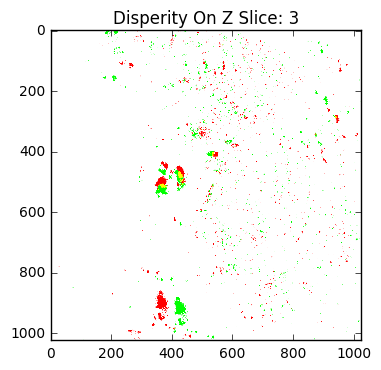

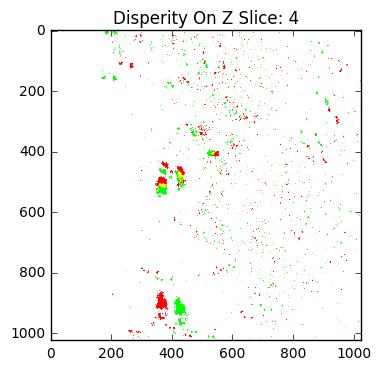

In [60]:
#Check if NDReg handles the basic case
regImg, initialErr, finalErr, reductionRatio = executeTest(transformVolume, outVolume, 200, verbose=True, display=True)

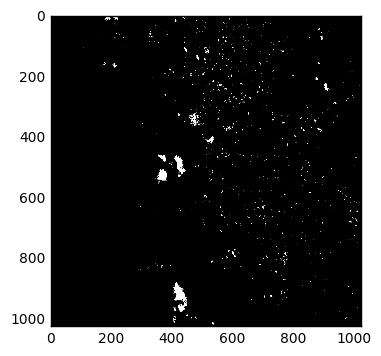

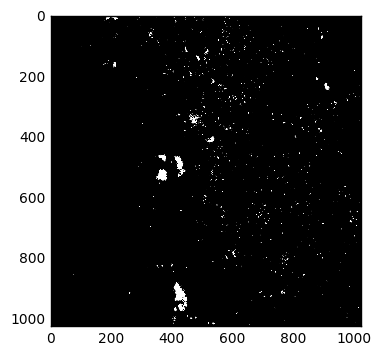

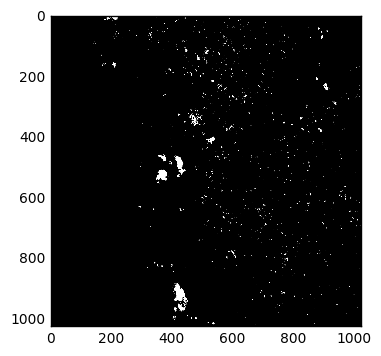

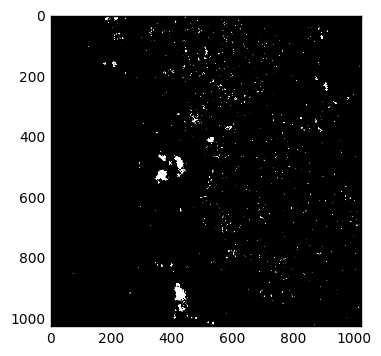

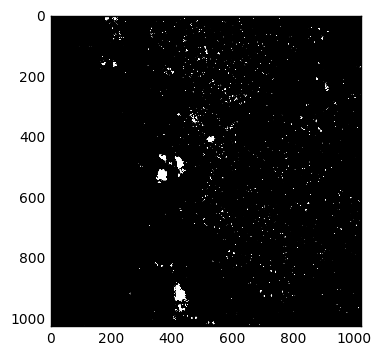

In [16]:
#display the output of the registration
for i in range(regImg.shape[0]):
    fig = plt.figure()
    plt.imshow(outVolume[i], cmap='gray')
    plt.show()

With an error reduction rate of ~44%, the regestration library is not doing a stellar job of aligning the images. I intend to investigate this low reduction rate with two branches:

1. Tune the iterations parameter
2. Tune the intensity of the error

### 1. Tuning Iterations
This fix assumes that NDReg can indeed align the images, but is not running gradient descent enough for them to become fully aligned. The code below will attempt to investigate this

200  iteration test  0
	Initial Error:  110266.0
	Transform:
[0.9975932877997035, 0.05842507161859518, -0.05792548260651925, -0.06162104745726014, 0.9975625945148371, -0.055072088456448946, 0.054513273971632206, 0.05845168451847105, 0.9977840056493715, 0.04733375669943689, -0.053518760362313074, 0.07005213287769078]
	Final Error:  60874.0
	Error Reduction Ratio:  0.447934993561


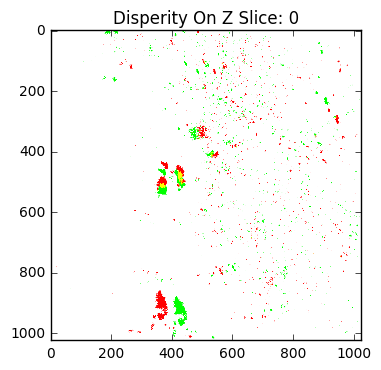

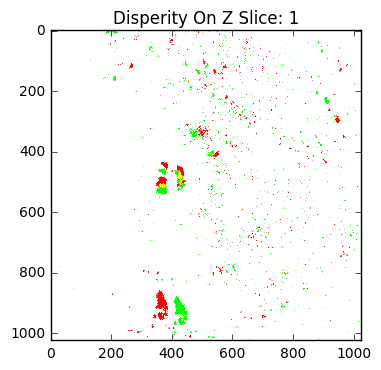

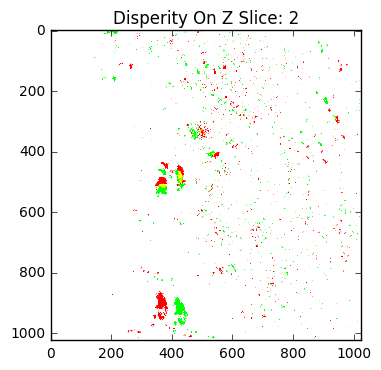

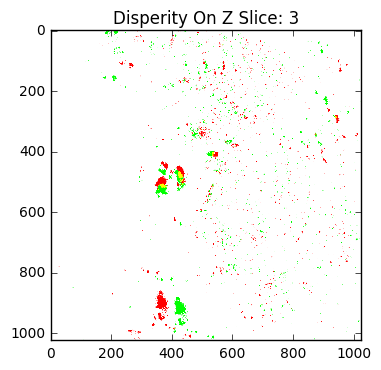

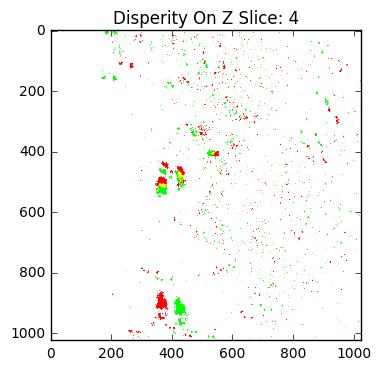




200  iteration test  1
	Initial Error:  110266.0
	Transform:
[0.9975932877997035, 0.05842507161859518, -0.05792548260651925, -0.06162104745726014, 0.9975625945148371, -0.055072088456448946, 0.054513273971632206, 0.05845168451847105, 0.9977840056493715, 0.04733375669943689, -0.053518760362313074, 0.07005213287769078]
	Final Error:  60874.0
	Error Reduction Ratio:  0.447934993561


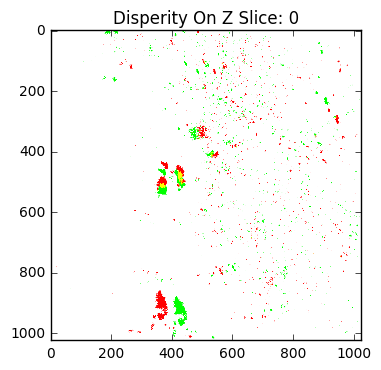

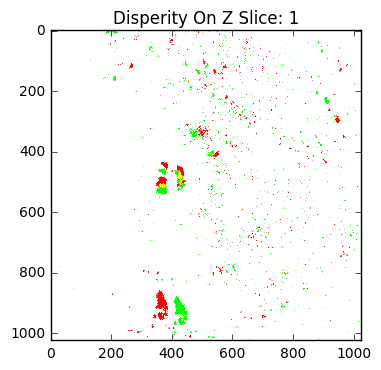

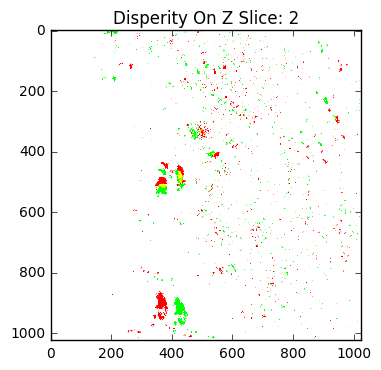

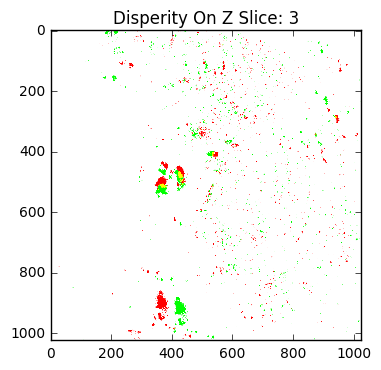

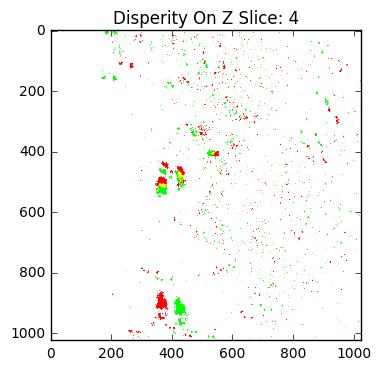




200  iteration test  2
	Initial Error:  110266.0
	Transform:
[0.9975932877997035, 0.05842507161859518, -0.05792548260651925, -0.06162104745726014, 0.9975625945148371, -0.055072088456448946, 0.054513273971632206, 0.05845168451847105, 0.9977840056493715, 0.04733375669943689, -0.053518760362313074, 0.07005213287769078]
	Final Error:  60874.0
	Error Reduction Ratio:  0.447934993561


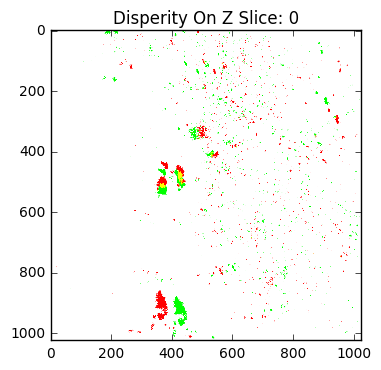

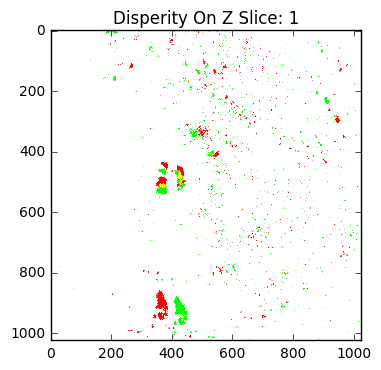

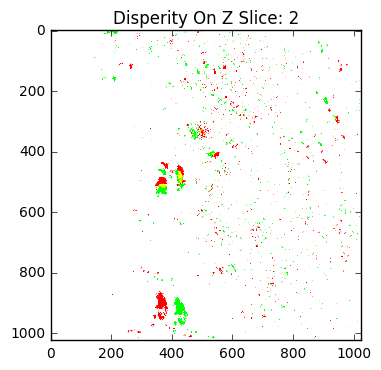

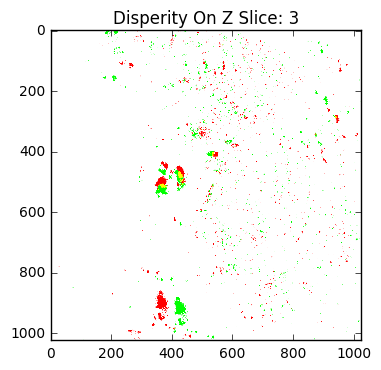

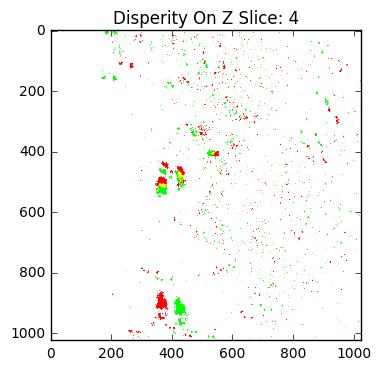




300  iteration test  0
	Initial Error:  110266.0
	Transform:
[0.9975932877997035, 0.05842507161859518, -0.05792548260651925, -0.06162104745726014, 0.9975625945148371, -0.055072088456448946, 0.054513273971632206, 0.05845168451847105, 0.9977840056493715, 0.04733375669943689, -0.053518760362313074, 0.07005213287769078]
	Final Error:  60874.0
	Error Reduction Ratio:  0.447934993561


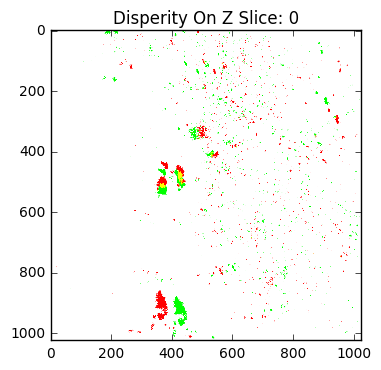

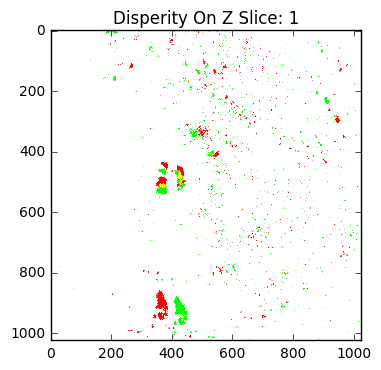

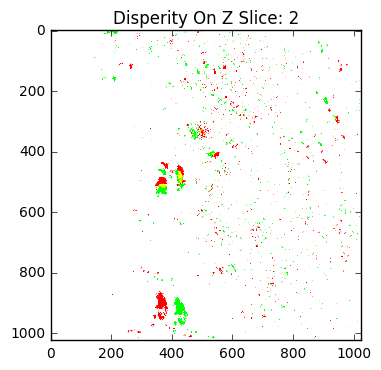

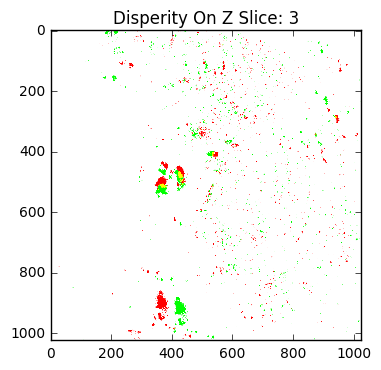

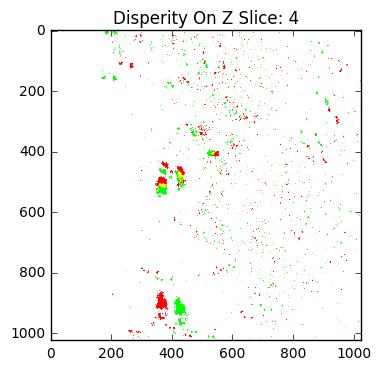




300  iteration test  1
	Initial Error:  110266.0
	Transform:
[0.9975932877997035, 0.05842507161859518, -0.05792548260651925, -0.06162104745726014, 0.9975625945148371, -0.055072088456448946, 0.054513273971632206, 0.05845168451847105, 0.9977840056493715, 0.04733375669943689, -0.053518760362313074, 0.07005213287769078]
	Final Error:  60874.0
	Error Reduction Ratio:  0.447934993561


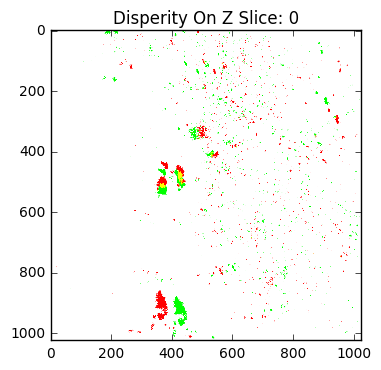

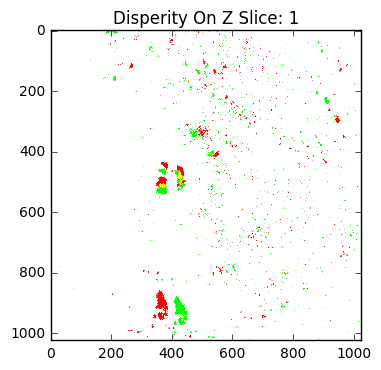

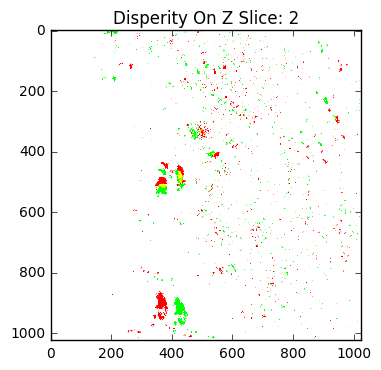

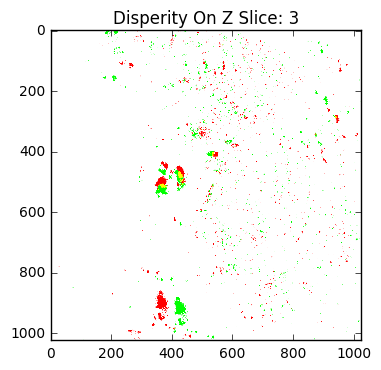

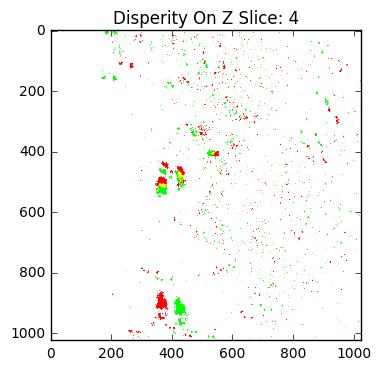




300  iteration test  2
	Initial Error:  110266.0
	Transform:
[0.9975932877997035, 0.05842507161859518, -0.05792548260651925, -0.06162104745726014, 0.9975625945148371, -0.055072088456448946, 0.054513273971632206, 0.05845168451847105, 0.9977840056493715, 0.04733375669943689, -0.053518760362313074, 0.07005213287769078]
	Final Error:  60874.0
	Error Reduction Ratio:  0.447934993561


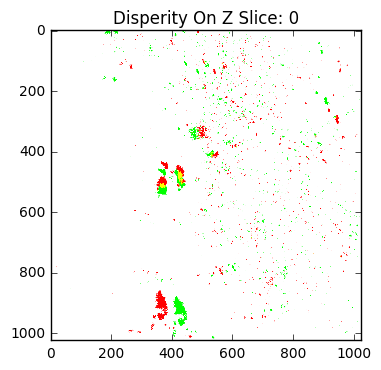

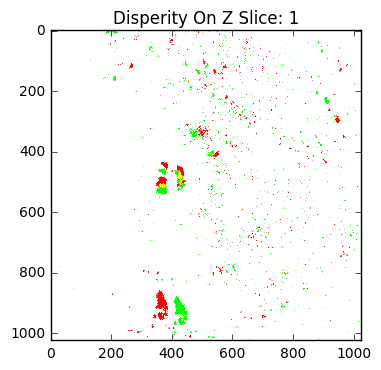

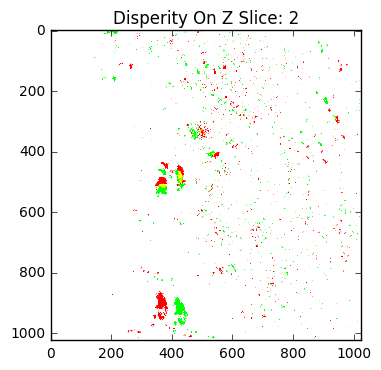

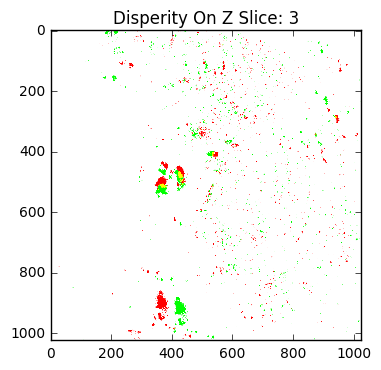

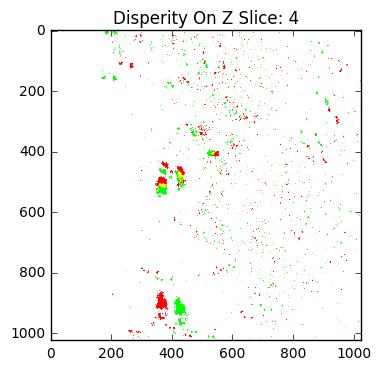




400  iteration test  0
	Initial Error:  110266.0
	Transform:
[0.9975932877997035, 0.05842507161859518, -0.05792548260651925, -0.06162104745726014, 0.9975625945148371, -0.055072088456448946, 0.054513273971632206, 0.05845168451847105, 0.9977840056493715, 0.04733375669943689, -0.053518760362313074, 0.07005213287769078]
	Final Error:  60874.0
	Error Reduction Ratio:  0.447934993561


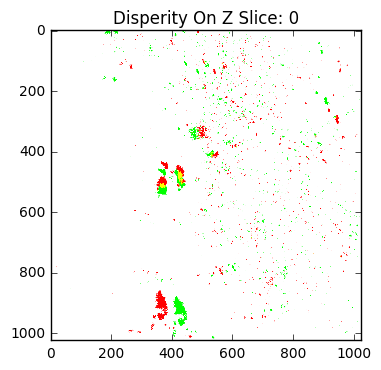

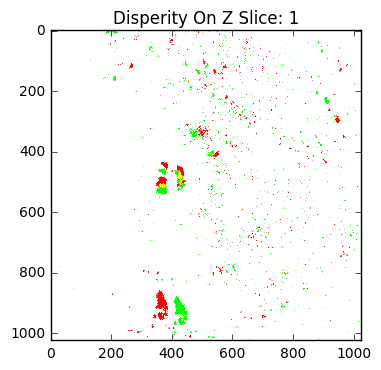

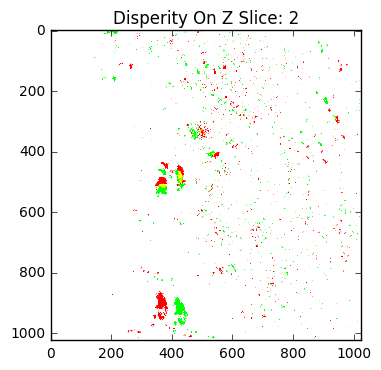

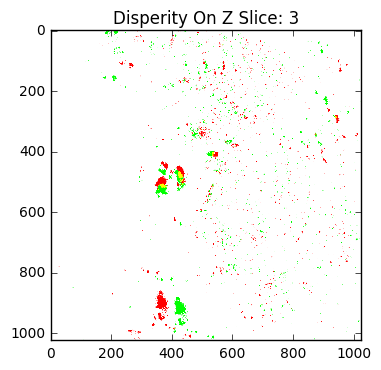

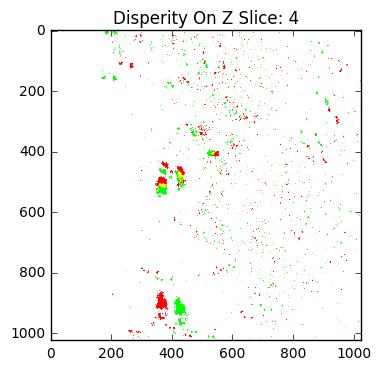




400  iteration test  1
	Initial Error:  110266.0
	Transform:
[0.9975932877997035, 0.05842507161859518, -0.05792548260651925, -0.06162104745726014, 0.9975625945148371, -0.055072088456448946, 0.054513273971632206, 0.05845168451847105, 0.9977840056493715, 0.04733375669943689, -0.053518760362313074, 0.07005213287769078]
	Final Error:  60874.0
	Error Reduction Ratio:  0.447934993561


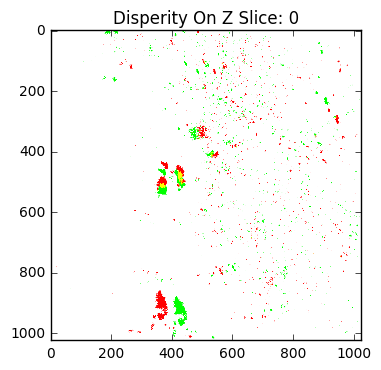

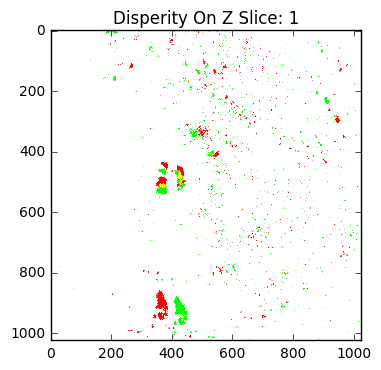

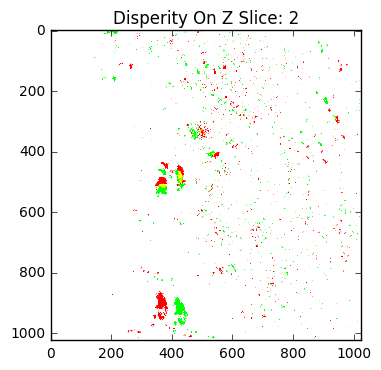

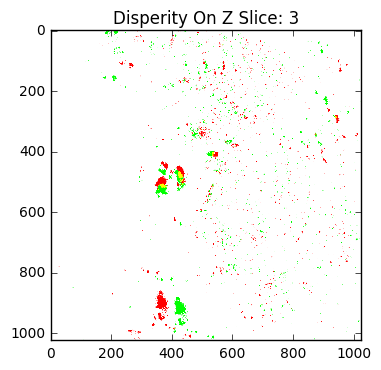

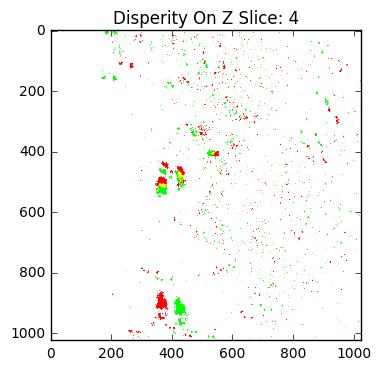




400  iteration test  2
	Initial Error:  110266.0
	Transform:
[0.9975932877997035, 0.05842507161859518, -0.05792548260651925, -0.06162104745726014, 0.9975625945148371, -0.055072088456448946, 0.054513273971632206, 0.05845168451847105, 0.9977840056493715, 0.04733375669943689, -0.053518760362313074, 0.07005213287769078]
	Final Error:  60874.0
	Error Reduction Ratio:  0.447934993561


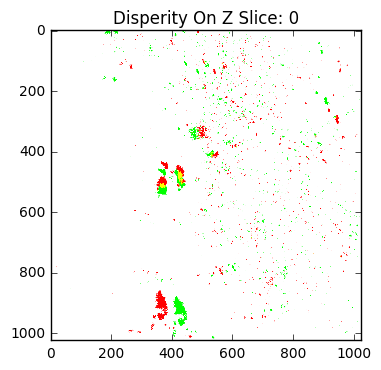

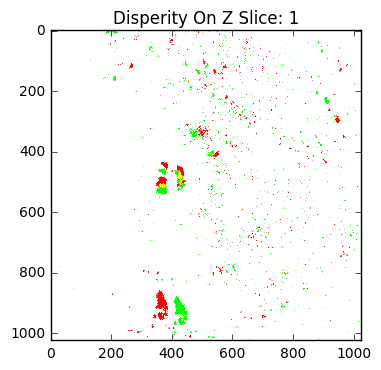

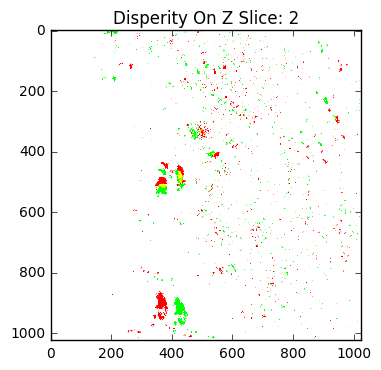

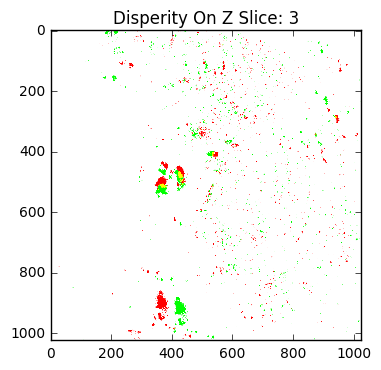

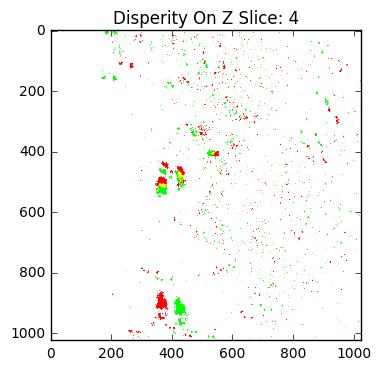




500  iteration test  0
	Initial Error:  110266.0
	Transform:
[0.9975932877997035, 0.05842507161859518, -0.05792548260651925, -0.06162104745726014, 0.9975625945148371, -0.055072088456448946, 0.054513273971632206, 0.05845168451847105, 0.9977840056493715, 0.04733375669943689, -0.053518760362313074, 0.07005213287769078]
	Final Error:  60874.0
	Error Reduction Ratio:  0.447934993561


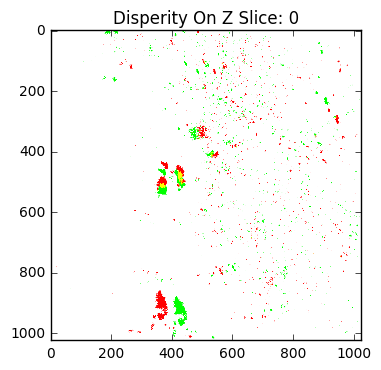

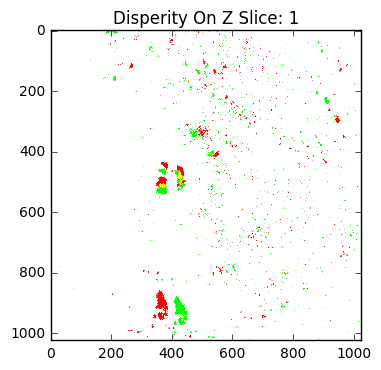

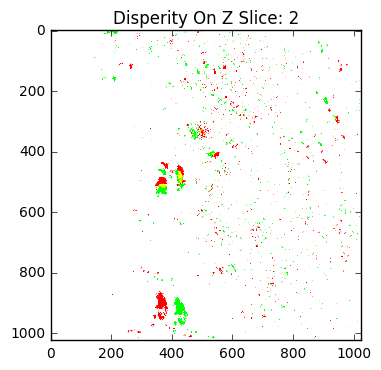

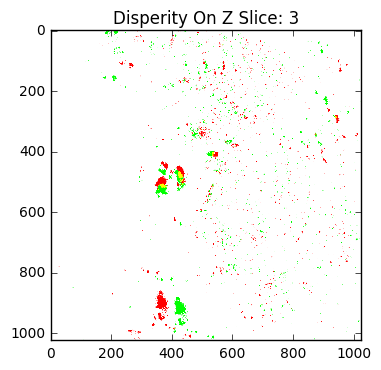

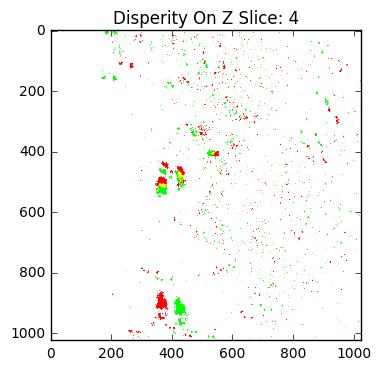




500  iteration test  1
	Initial Error:  110266.0
	Transform:
[0.9975932877997035, 0.05842507161859518, -0.05792548260651925, -0.06162104745726014, 0.9975625945148371, -0.055072088456448946, 0.054513273971632206, 0.05845168451847105, 0.9977840056493715, 0.04733375669943689, -0.053518760362313074, 0.07005213287769078]
	Final Error:  60874.0
	Error Reduction Ratio:  0.447934993561


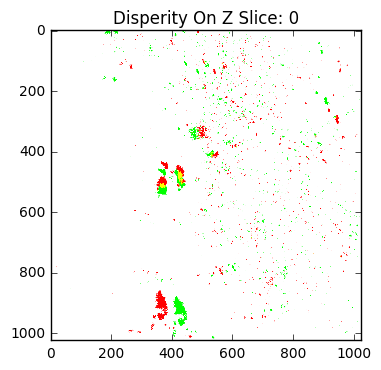

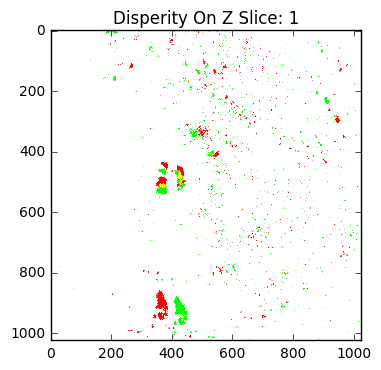

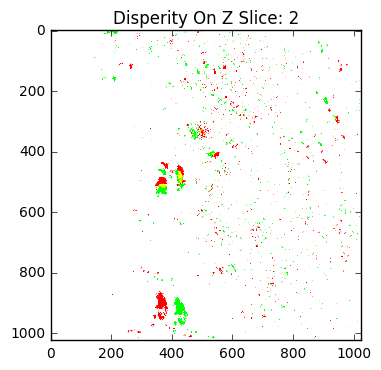

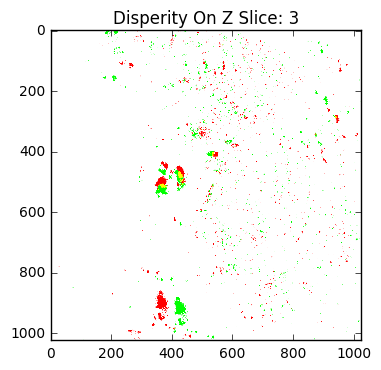

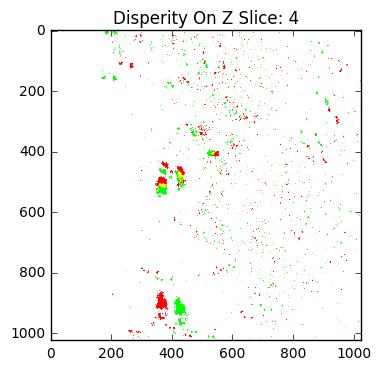




500  iteration test  2
	Initial Error:  110266.0
	Transform:
[0.9975932877997035, 0.05842507161859518, -0.05792548260651925, -0.06162104745726014, 0.9975625945148371, -0.055072088456448946, 0.054513273971632206, 0.05845168451847105, 0.9977840056493715, 0.04733375669943689, -0.053518760362313074, 0.07005213287769078]
	Final Error:  60874.0
	Error Reduction Ratio:  0.447934993561


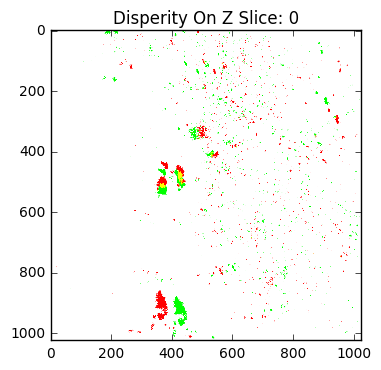

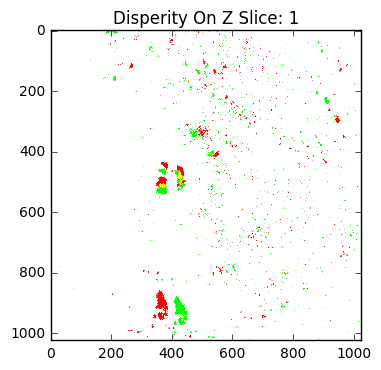

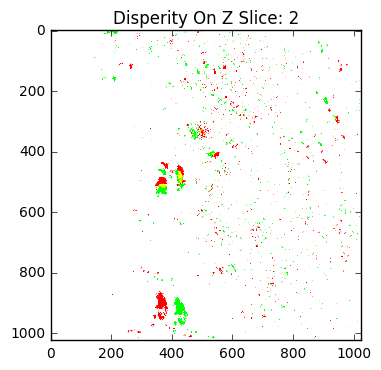

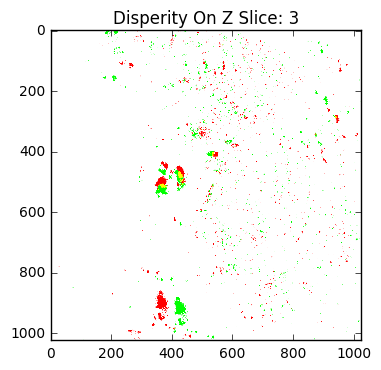

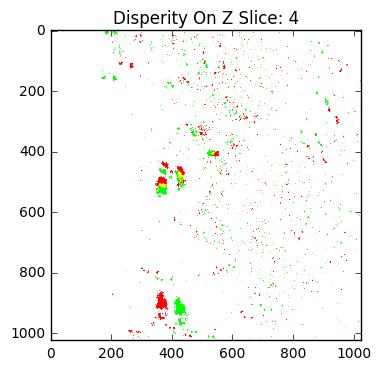

In [61]:
fullSimData = []
for iterations in (200, 300, 400, 500):
    testData = []
    for test in range(3):
        print iterations, ' iteration test ', test
        regImg, initialErr, finalErr, reductionRatio = executeTest(transformVolume,
                                                                   outVolume,
                                                                   iterations,
                                                                   verbose=True,
                                                                   display=True)
        print '\n\n'
        testData.append([initialErr, finalErr, reductionRatio])
    fullSimData.append(testData)

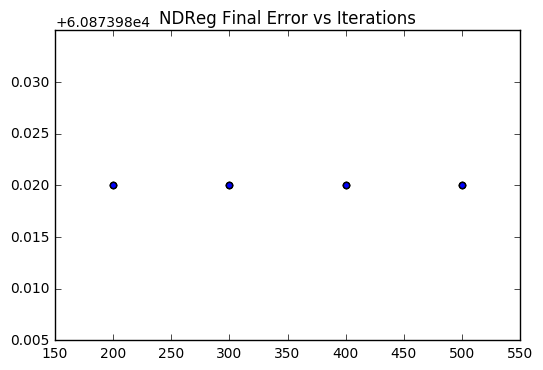

In [35]:
#display the full sim data
fig = plt.figure()
plt.title('NDReg Final Error vs Iterations')

scatterList = []
for trial in fullSimData:
    for test in trial:
        scatterList.append(test[1])
        
plt.scatter([200, 200, 200, 300, 300, 300, 400, 400, 400, 500, 500, 500], scatterList)
plt.show()

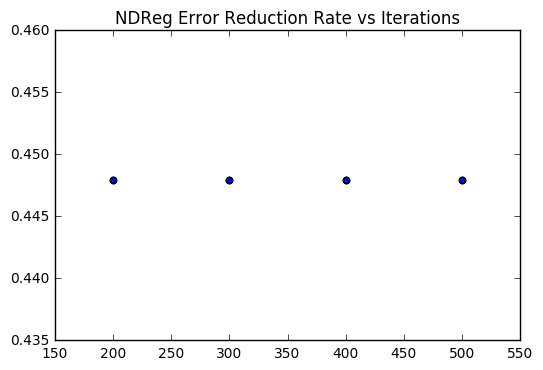

In [38]:
#display the full sim data
fig = plt.figure()
plt.title('NDReg Error Reduction Rate vs Iterations')

scatterList = []
for trial in fullSimData:
    for test in trial:
        scatterList.append(test[2])
        
plt.scatter([200, 200, 200, 300, 300, 300, 400, 400, 400, 500, 500, 500], scatterList)
plt.show()

- The plots above demonstrate that both the error reduction rate and the final error are independent of iteration number, in this circumstance.

- Each iteration test was run 3 times, and all 3 tests resulted in the same final error and error rediction rate.

- Every single test, regardless of iteration trial number, resulted in the same final error and error reduction rate

### 2. Tuning Error Intensity
One possibility is that the magnitude of the error is too great for NDReg to overcome. To check this, I will run NDReg on images which have increasing amounts of error.

Out of bounds fraction:  0.0
NDReg test with yaw displacement of:  0  radians
	Initial Error:  0.0
	Transform:
[1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
	Final Error:  0.0
	Error Reduction Ratio:  nan


/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:26: RuntimeWarning: invalid value encountered in double_scalars


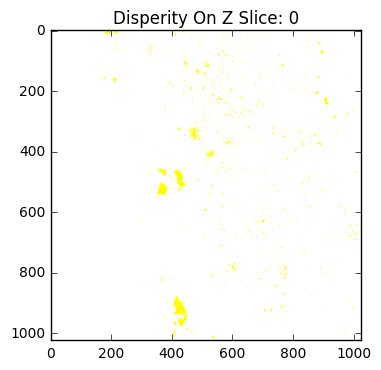

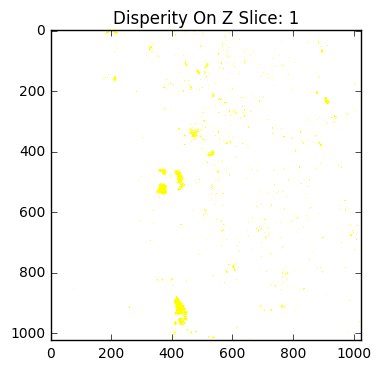

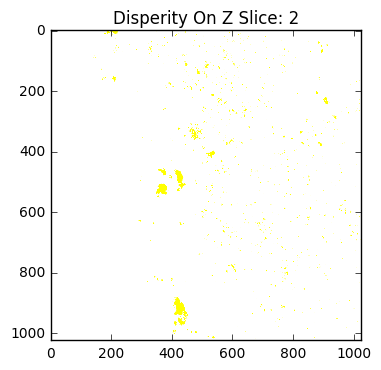

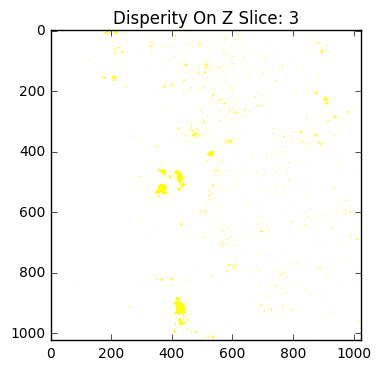

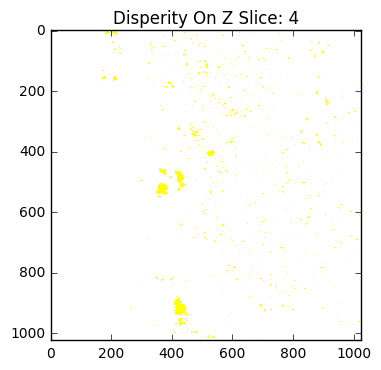




Out of bounds fraction:  0.00199794769287
NDReg test with yaw displacement of:  1  radians
	Initial Error:  63569.0
	Transform:
[0.993758124633653, -0.10124157538434654, 0.0429258367593211, 0.1010966193624297, 0.9946841100458013, 0.005539774279452511, -0.04326612533241464, -0.0011657440863908708, 0.998886569017039, 0.042777603708944366, -0.09027928031101756, 0.0046107865632572355]
	Final Error:  60874.0
	Error Reduction Ratio:  0.0423948780066


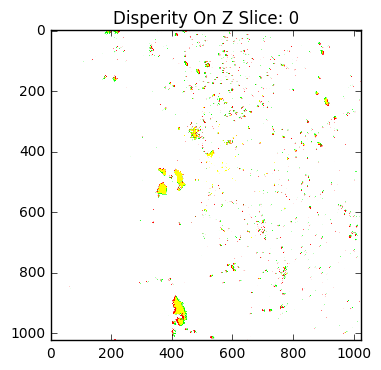

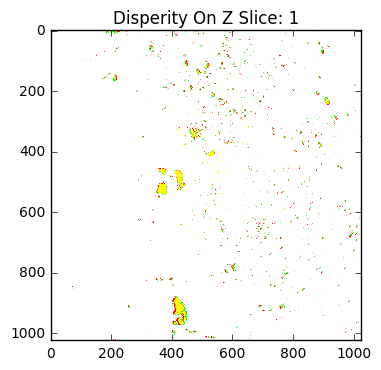

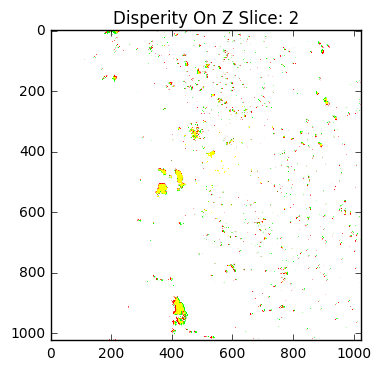

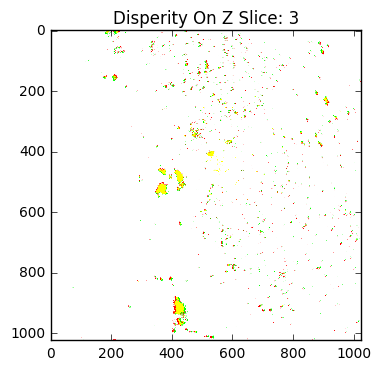

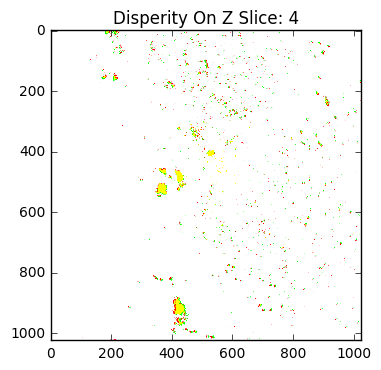




Out of bounds fraction:  0.00441551208496
NDReg test with yaw displacement of:  2  radians
	Initial Error:  79155.0
	Transform:
[0.9730114511910151, -0.05739542340110039, -0.048670255280576426, 0.056045048059787946, 0.9739027634048949, -0.02804768342659543, 0.05021932859411921, 0.02516913447520343, 0.9742991564353518, 0.23005652338471308, -0.5530684935806827, 0.036251260167194946]
	Final Error:  60874.0
	Error Reduction Ratio:  0.230951929758


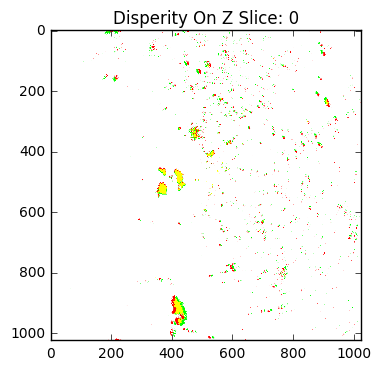

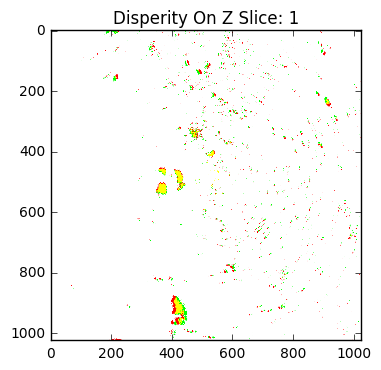

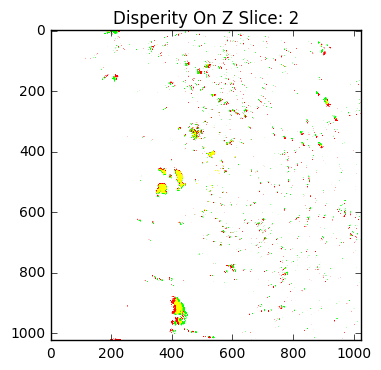

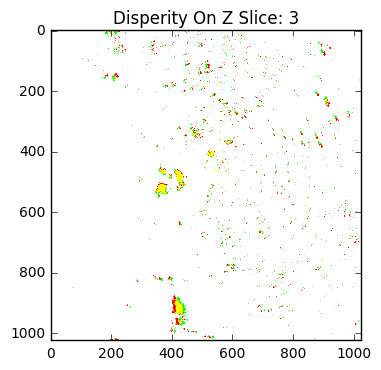

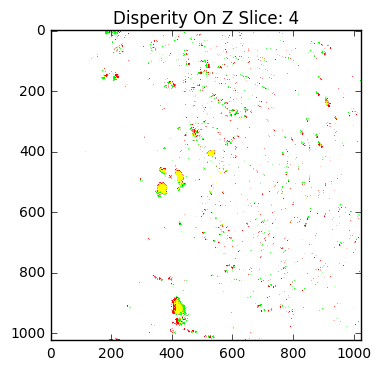




Out of bounds fraction:  0.00680255889893
NDReg test with yaw displacement of:  3  radians
	Initial Error:  86539.0
	Transform:
[0.9572892482791396, -0.07239942489209622, -0.0362191274862986, 0.07102572489920135, 0.9573817683594602, -0.03649250343387098, 0.03884389685803937, 0.03368500674813403, 0.9593292859017051, -0.014291004502527191, -1.6979235627140736, 0.05692017970526045]
	Final Error:  60874.0
	Error Reduction Ratio:  0.296571488


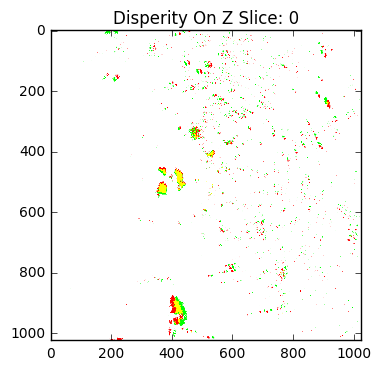

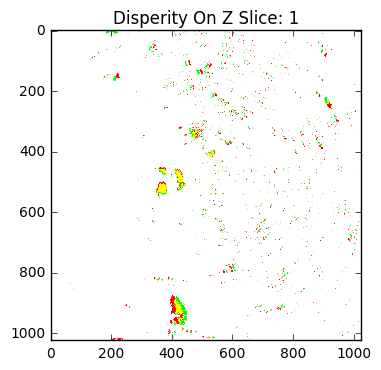

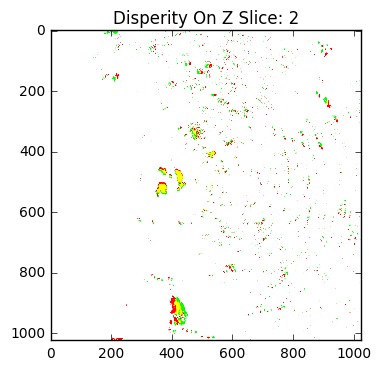

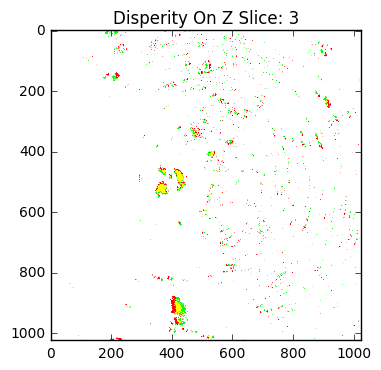

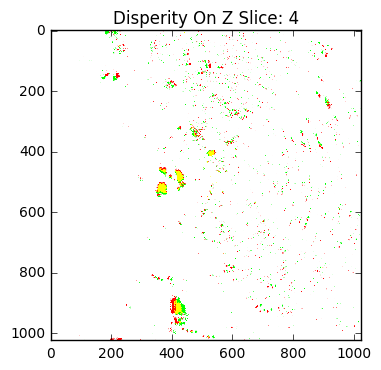




Out of bounds fraction:  0.00912094116211
NDReg test with yaw displacement of:  4  radians
	Initial Error:  91421.0
	Transform:
[0.9464374143406574, -0.05841294317396204, -0.04182438866880702, 0.05665219628346219, 0.9466191682299457, -0.04009750213540902, 0.044180086849439575, 0.03748611864403329, 0.9473901210782043, -0.4760805907399779, -3.060828042849281, 0.08787284619484913]
	Final Error:  60874.0
	Error Reduction Ratio:  0.334135483095


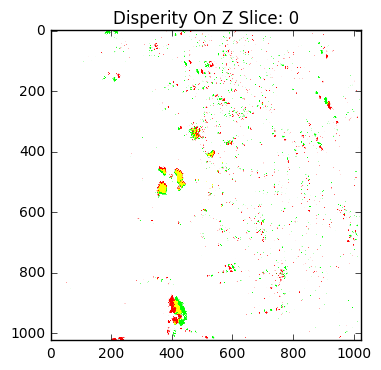

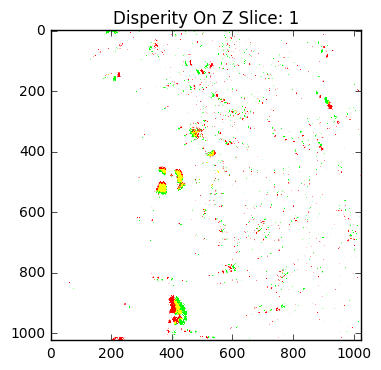

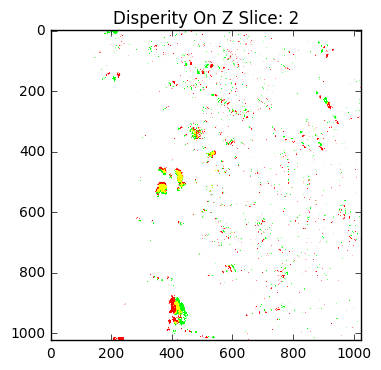

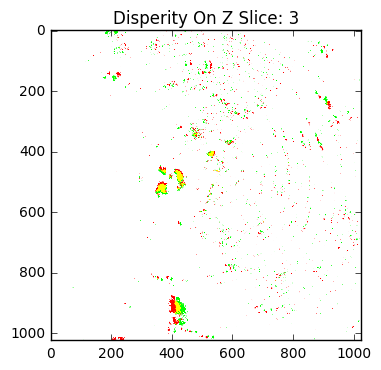

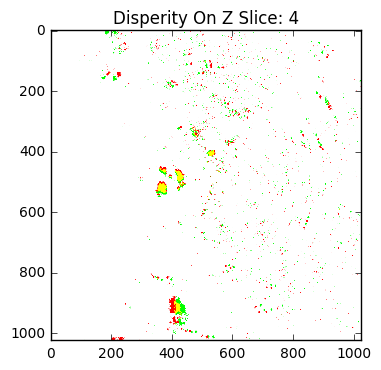




Out of bounds fraction:  0.0114212036133
NDReg test with yaw displacement of:  5  radians
	Initial Error:  95648.0
	Transform:
[0.9368809398002441, -0.03789249457585741, -0.0472367255883361, 0.03569235751225786, 0.9371324703427768, -0.04383872027032284, 0.048920394568179024, 0.041951598712576636, 0.9366215367538964, -0.39953147348564916, -4.779430691335131, 0.15633808774233227]
	Final Error:  60874.0
	Error Reduction Ratio:  0.36356222817


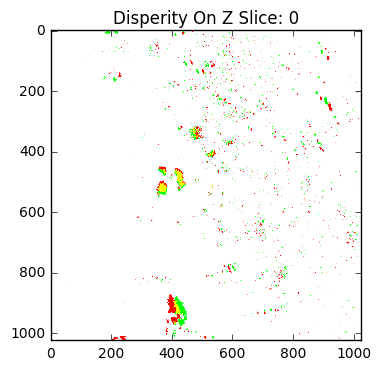

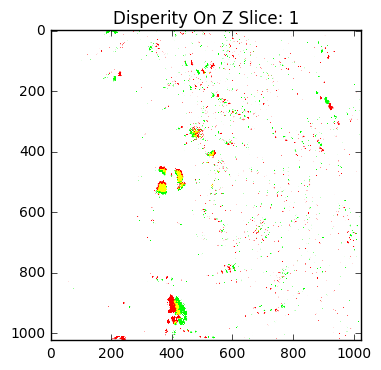

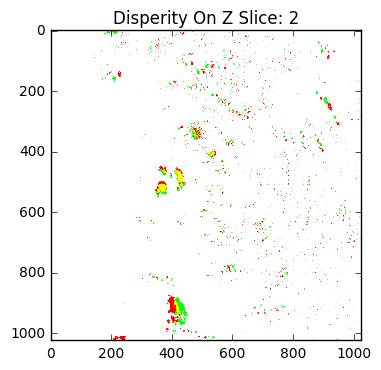

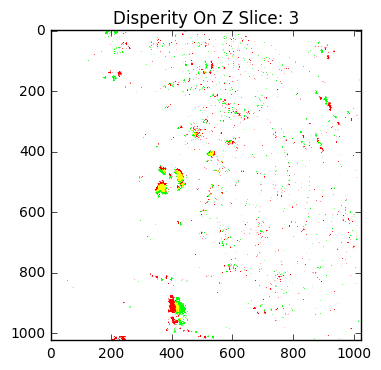

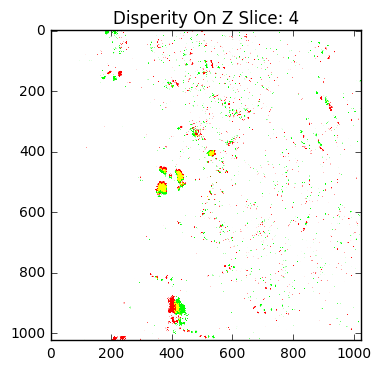

In [62]:
fullSimData = []
for i in range(6):
    transform = getTransform(pitch=0., yaw=i/100., roll=0., xT=0., yT=0., zT=0.)
    transformVolume = applyRigid(outVolume, transform, True)
    print 'NDReg test with yaw displacement of: ', i, ' radians'
    regImg, initialErr, finalErr, reductionRatio = executeTest(transformVolume, outVolume, 300, verbose=True, display=True)
    fullSimData.append([initialErr, finalErr, reductionRatio])
    print '\n\n'

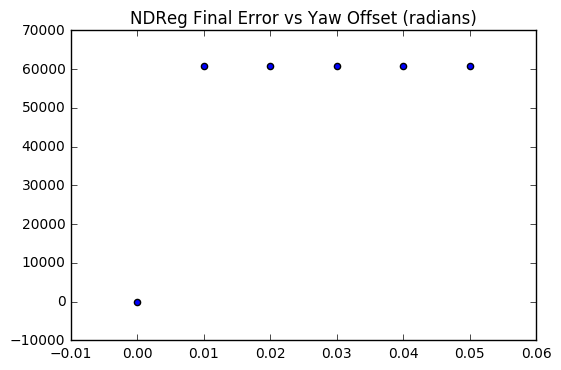

In [44]:
#display the full sim data
fig = plt.figure()
plt.title('NDReg Final Error vs Yaw Offset (radians)')

scatterList = []
for trial in fullSimData:
     scatterList.append(trial[1])
        
plt.scatter([0., .01, .02, .03, .04, .05], scatterList)
plt.show()

- There is obviously a disconnect between NDReg's functionality and the task of binary matching. Even with a simple yaw offset of only .01 radians, NDReg converges to an improper optima.

### Method 1 Conclusion
In summary, it seems that raw binary mask matching is an unfit input modality for NDReg. Additionally, based on NDReg's performance on the input data thus far, there is no reason to investigate the intuitively more difficult method 2.

## B. Centroid Matching
Comparing the results of NDReg on the binary volumes and the noise volume from the 'Revisited' notebook, the binary volumes saw a large (~30%) improvement in error reduction ratio, as well as a huge (orders of magnitude) reduction in raw final error. 

Due to this, I find it worthwhile to investigate a method that continues to remove information from the images being registered. In this test, I will simply attempt to register the centroids of the resultant clusters after the PLOS pipeline. I would like to investigate this using the same two metods as I did the Binary Mask Matching

### Method 1

In [65]:
#generate the requisite centroid volume
clusterList = cLib.connectedComponents(outVolume)
centroidVolume = np.zeros_like(outVolume)
for cluster in clusterList:
    z, y, x = cluster.centroid
    centroidVolume[int(z)][int(y)][int(x)] = 1.

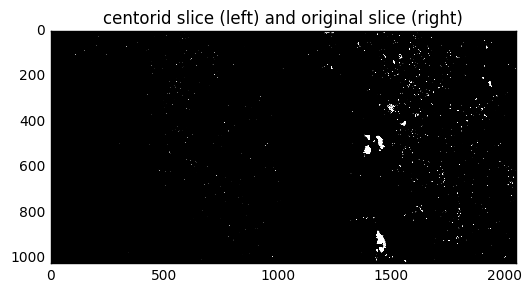

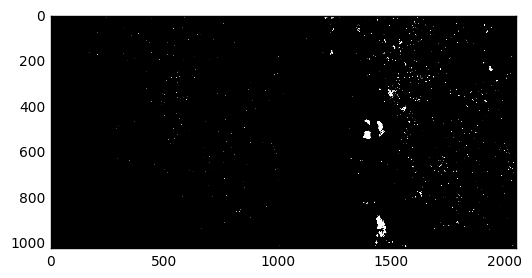

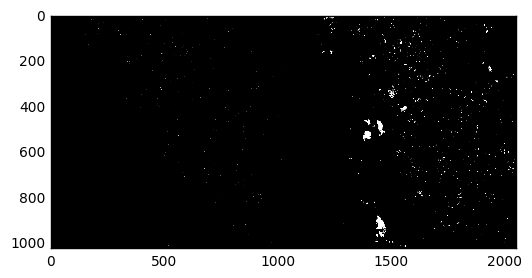

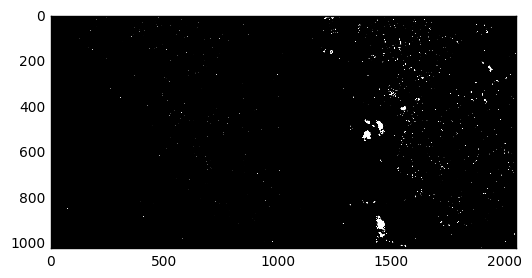

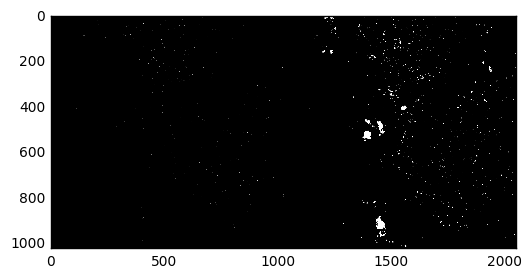

In [14]:
#plot the centroid and out volumes side by side
fig = plt.figure()
plt.title('centorid slice (left) and original slice (right)')
for i in range(centroidVolume.shape[0]):
    plotImg = np.concatenate((centroidVolume[i], outVolume[i]), axis=1)
    plt.imshow(plotImg, cmap='gray')
    plt.show()

Now, I will run the same set of tests that I did for the prior method. That is, I will plot error vs number of iterations as well as error vs yaw displacement. (The current set of tests are only displacing in the yaw direction by a small amount)

In [15]:
#generate and apply a basic transform to the output
transform = getTransform(pitch=0., yaw=.15, roll=0., xT=0., yT=0., zT=0.)
transformVolume = applyRigid(centroidVolume, transform, True)

Out of bounds fraction:  0.0318670272827


200  iteration test  0
	Initial Error:  8895.0
	Transform:
[0.9519573537187093, -0.016514387057642323, 0.026409263151808388, 0.012559058327132994, 0.9425256382791283, 0.13667724280104696, -0.028503407060328067, -0.13625591240702564, 0.9422392793655553, -1.798305281381782e-05, -1.7594346478382688e-05, -0.00011489654902256143]
	Final Error:  4481.0
	Error Reduction Ratio:  0.496233839236


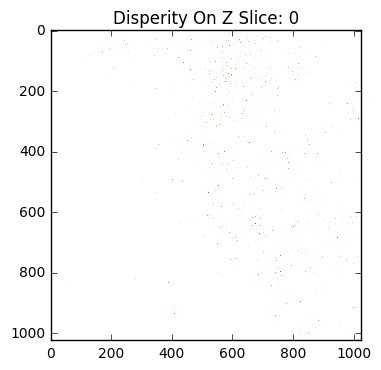

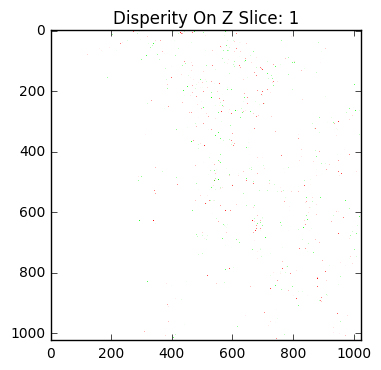

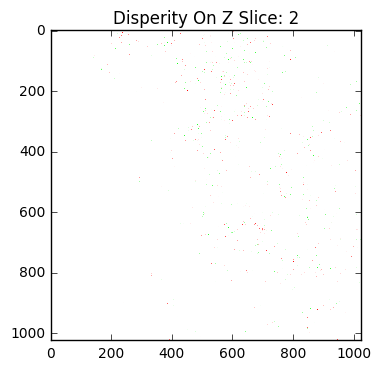

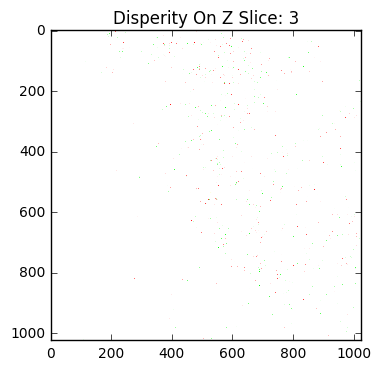

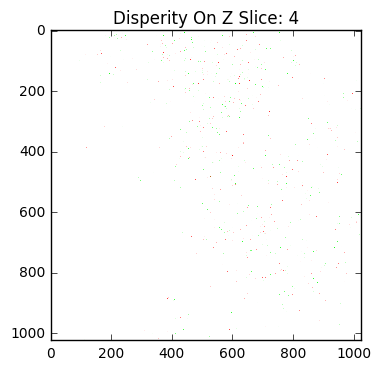




200  iteration test  1
	Initial Error:  8895.0
	Transform:
[0.9519573537187093, -0.016514387057642323, 0.026409263151808388, 0.012559058327132994, 0.9425256382791283, 0.13667724280104696, -0.028503407060328067, -0.13625591240702564, 0.9422392793655553, -1.798305281381782e-05, -1.7594346478382688e-05, -0.00011489654902256143]
	Final Error:  4481.0
	Error Reduction Ratio:  0.496233839236


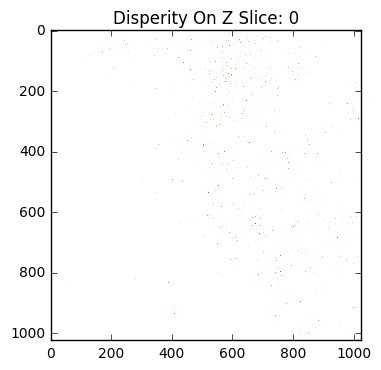

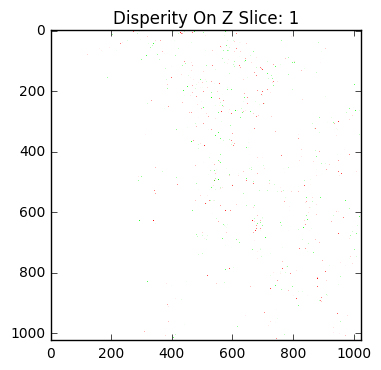

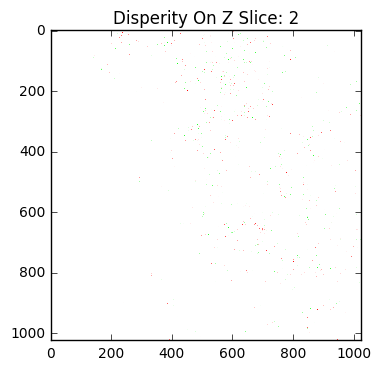

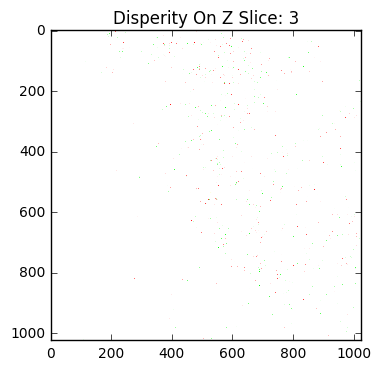

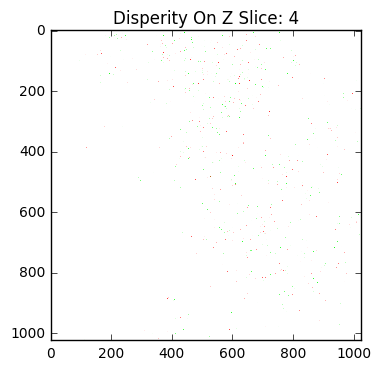




200  iteration test  2
	Initial Error:  8895.0
	Transform:
[0.9519573537187093, -0.016514387057642323, 0.026409263151808388, 0.012559058327132994, 0.9425256382791283, 0.13667724280104696, -0.028503407060328067, -0.13625591240702564, 0.9422392793655553, -1.798305281381782e-05, -1.7594346478382688e-05, -0.00011489654902256143]
	Final Error:  4481.0
	Error Reduction Ratio:  0.496233839236


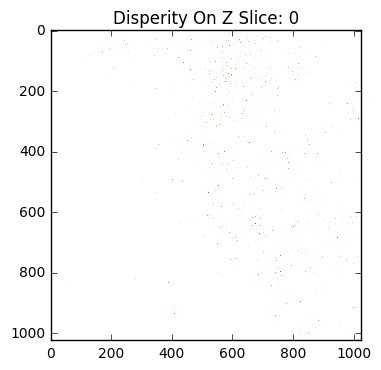

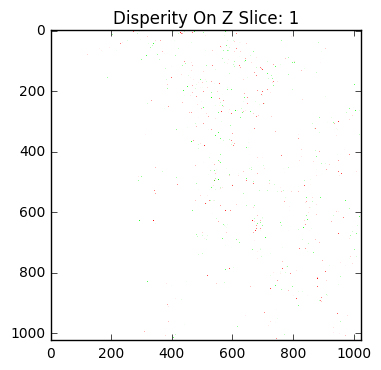

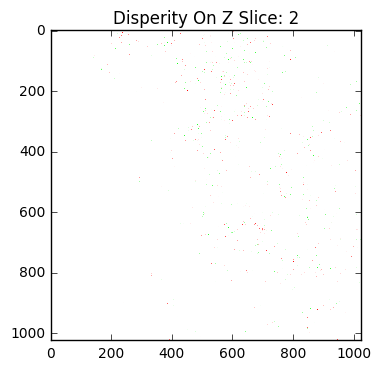

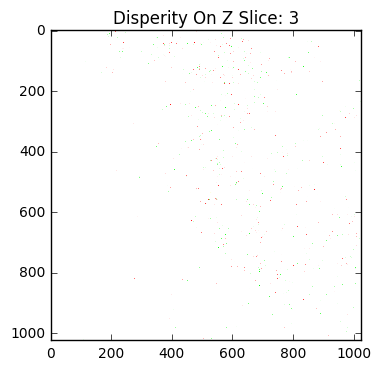

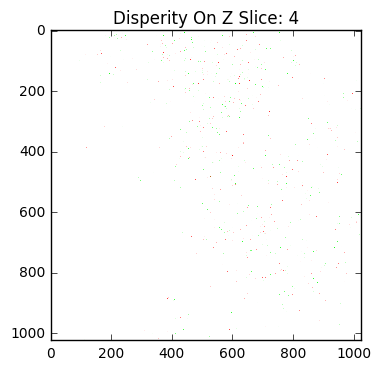




300  iteration test  0
	Initial Error:  8895.0
	Transform:
[0.9519573537187093, -0.016514387057642323, 0.026409263151808388, 0.012559058327132994, 0.9425256382791283, 0.13667724280104696, -0.028503407060328067, -0.13625591240702564, 0.9422392793655553, -1.798305281381782e-05, -1.7594346478382688e-05, -0.00011489654902256143]
	Final Error:  4481.0
	Error Reduction Ratio:  0.496233839236


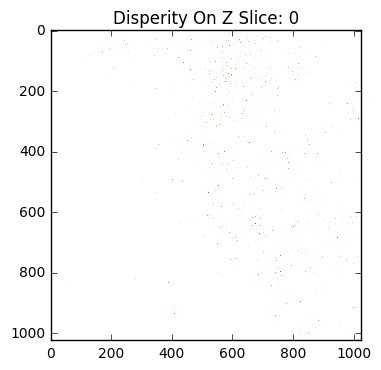

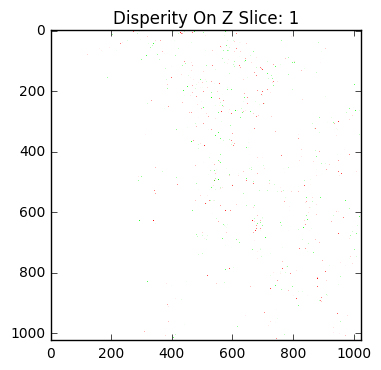

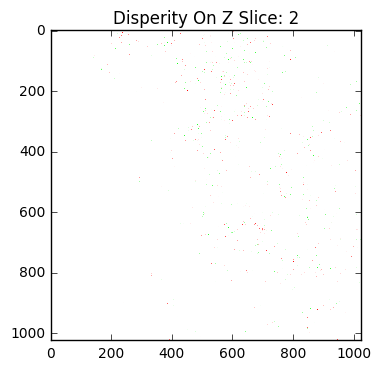

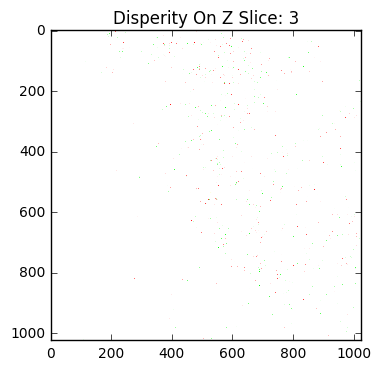

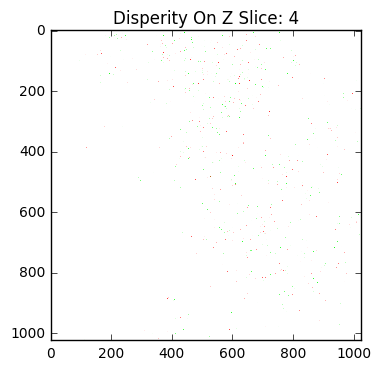




300  iteration test  1
	Initial Error:  8895.0
	Transform:
[0.9519573537187093, -0.016514387057642323, 0.026409263151808388, 0.012559058327132994, 0.9425256382791283, 0.13667724280104696, -0.028503407060328067, -0.13625591240702564, 0.9422392793655553, -1.798305281381782e-05, -1.7594346478382688e-05, -0.00011489654902256143]
	Final Error:  4481.0
	Error Reduction Ratio:  0.496233839236


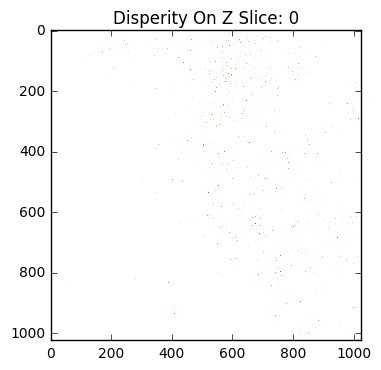

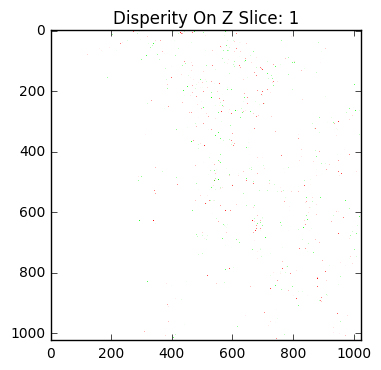

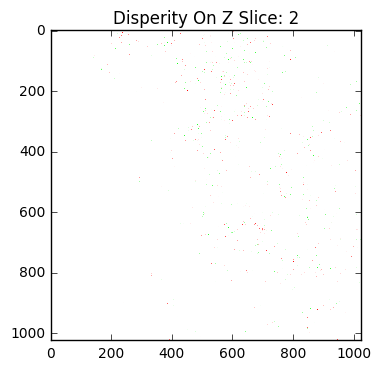

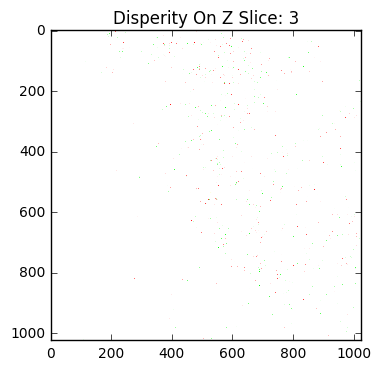

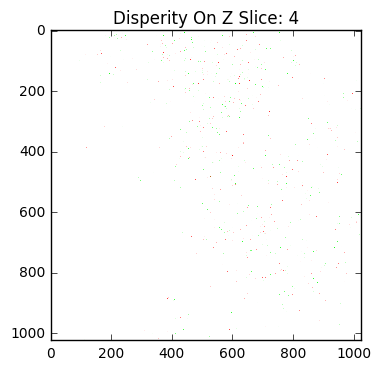




300  iteration test  2
	Initial Error:  8895.0
	Transform:
[0.9519573537187093, -0.016514387057642323, 0.026409263151808388, 0.012559058327132994, 0.9425256382791283, 0.13667724280104696, -0.028503407060328067, -0.13625591240702564, 0.9422392793655553, -1.798305281381782e-05, -1.7594346478382688e-05, -0.00011489654902256143]
	Final Error:  4481.0
	Error Reduction Ratio:  0.496233839236


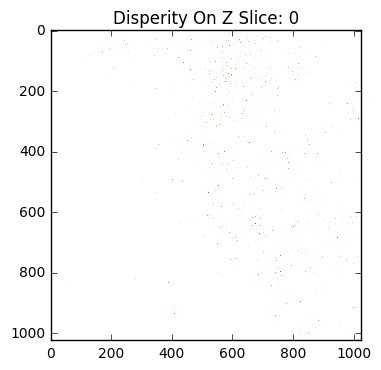

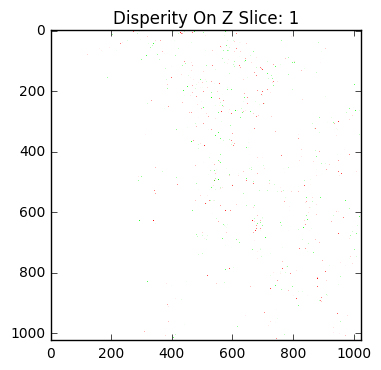

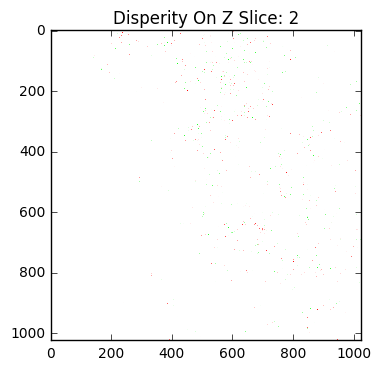

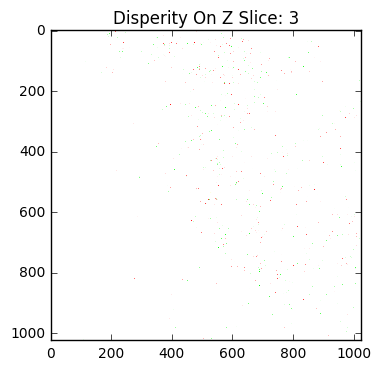

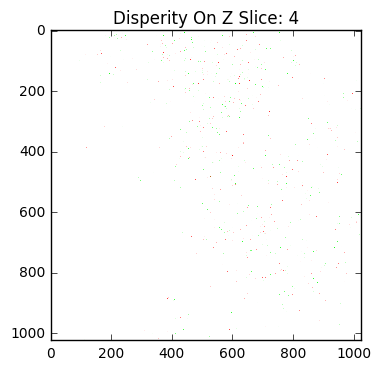




400  iteration test  0
	Initial Error:  8895.0
	Transform:
[0.9519573537187093, -0.016514387057642323, 0.026409263151808388, 0.012559058327132994, 0.9425256382791283, 0.13667724280104696, -0.028503407060328067, -0.13625591240702564, 0.9422392793655553, -1.798305281381782e-05, -1.7594346478382688e-05, -0.00011489654902256143]
	Final Error:  4481.0
	Error Reduction Ratio:  0.496233839236


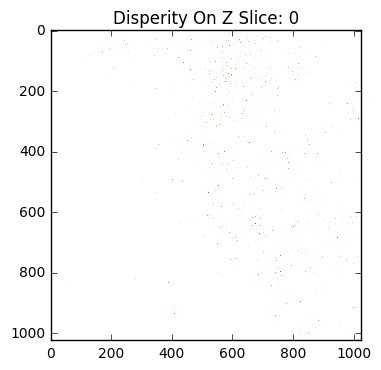

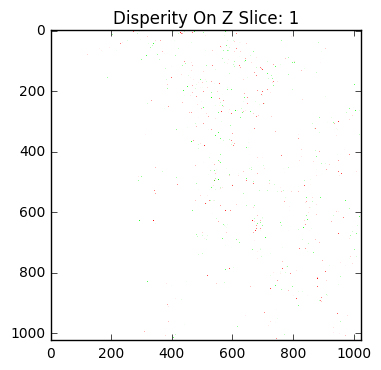

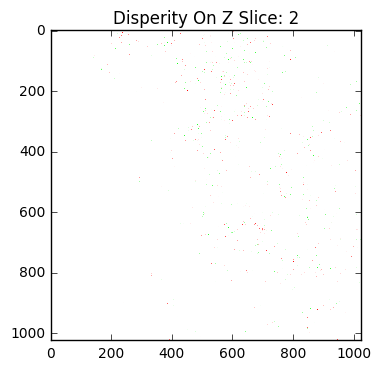

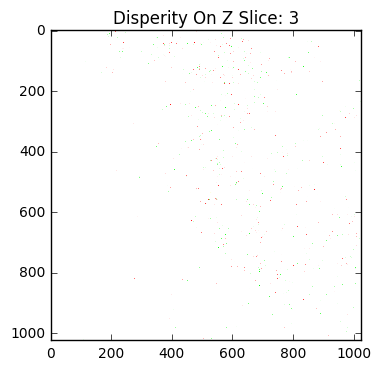

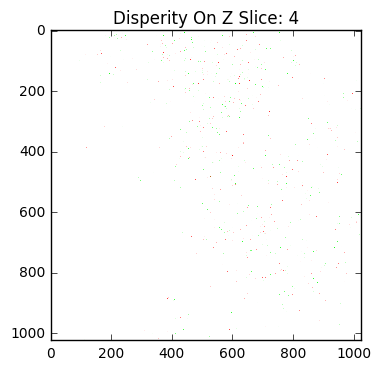




400  iteration test  1
	Initial Error:  8895.0
	Transform:
[0.9519573537187093, -0.016514387057642323, 0.026409263151808388, 0.012559058327132994, 0.9425256382791283, 0.13667724280104696, -0.028503407060328067, -0.13625591240702564, 0.9422392793655553, -1.798305281381782e-05, -1.7594346478382688e-05, -0.00011489654902256143]
	Final Error:  4481.0
	Error Reduction Ratio:  0.496233839236


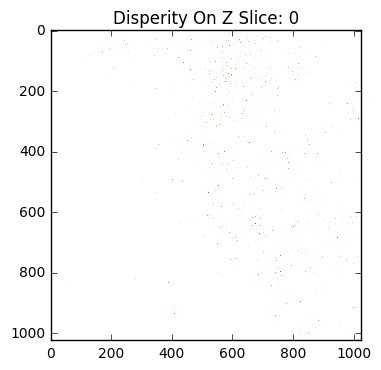

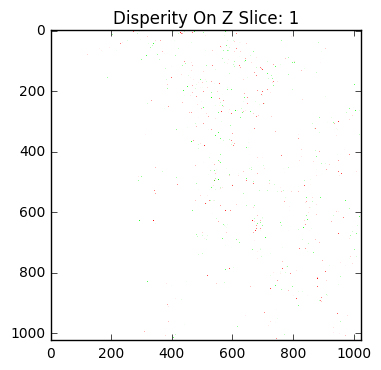

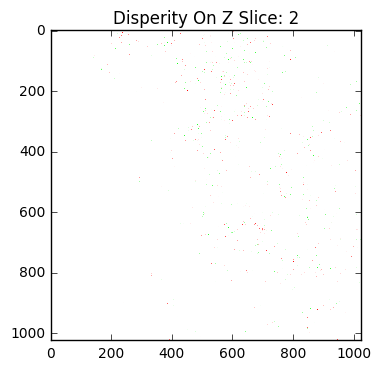

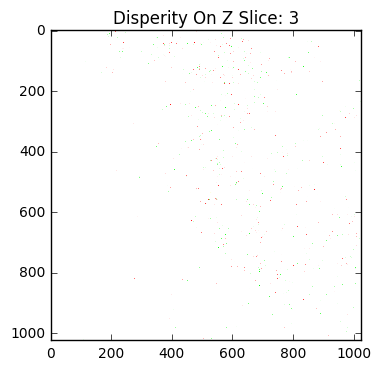

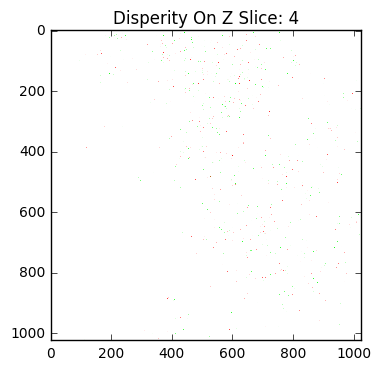




400  iteration test  2
	Initial Error:  8895.0
	Transform:
[0.9519573537187093, -0.016514387057642323, 0.026409263151808388, 0.012559058327132994, 0.9425256382791283, 0.13667724280104696, -0.028503407060328067, -0.13625591240702564, 0.9422392793655553, -1.798305281381782e-05, -1.7594346478382688e-05, -0.00011489654902256143]
	Final Error:  4481.0
	Error Reduction Ratio:  0.496233839236


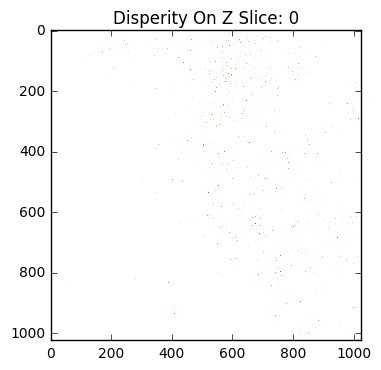

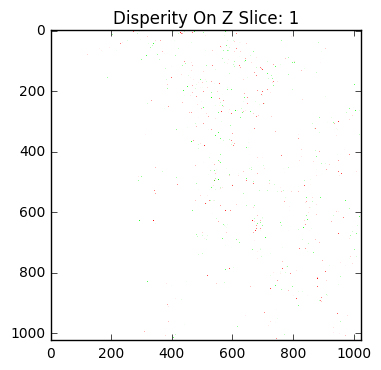

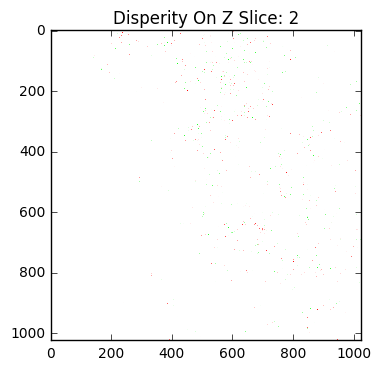

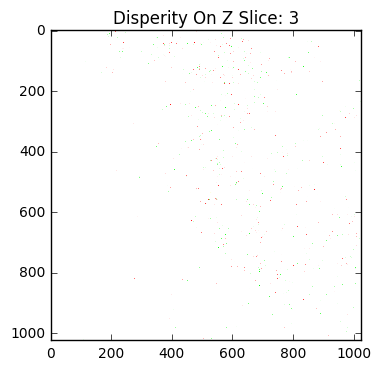

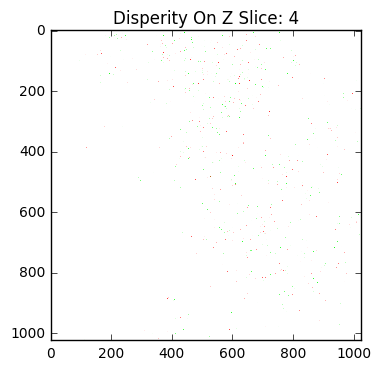




500  iteration test  0
	Initial Error:  8895.0
	Transform:
[0.9519573537187093, -0.016514387057642323, 0.026409263151808388, 0.012559058327132994, 0.9425256382791283, 0.13667724280104696, -0.028503407060328067, -0.13625591240702564, 0.9422392793655553, -1.798305281381782e-05, -1.7594346478382688e-05, -0.00011489654902256143]
	Final Error:  4481.0
	Error Reduction Ratio:  0.496233839236


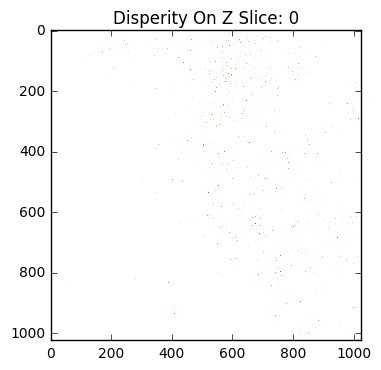

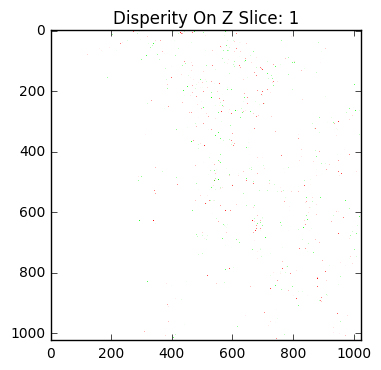

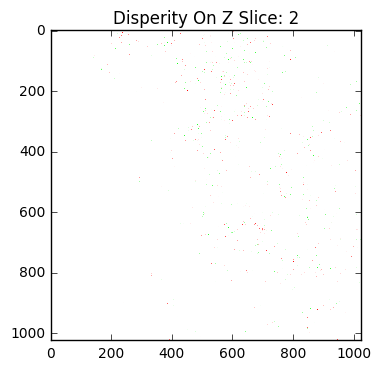

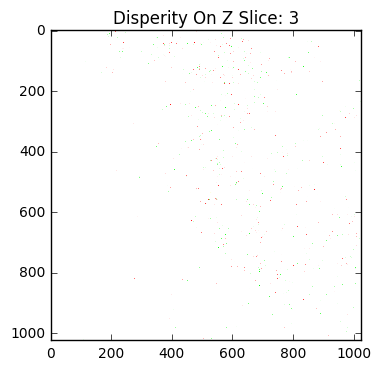

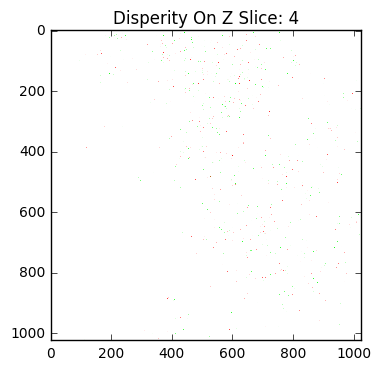




500  iteration test  1
	Initial Error:  8895.0
	Transform:
[0.9519573537187093, -0.016514387057642323, 0.026409263151808388, 0.012559058327132994, 0.9425256382791283, 0.13667724280104696, -0.028503407060328067, -0.13625591240702564, 0.9422392793655553, -1.798305281381782e-05, -1.7594346478382688e-05, -0.00011489654902256143]
	Final Error:  4481.0
	Error Reduction Ratio:  0.496233839236


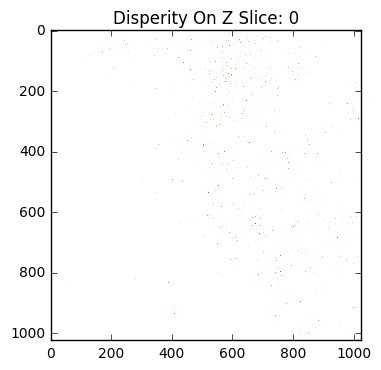

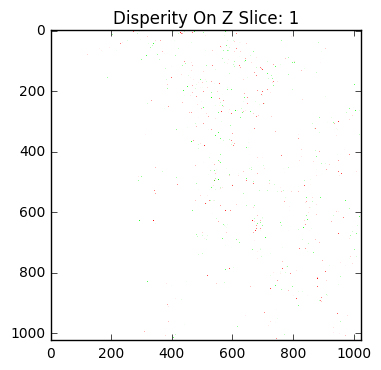

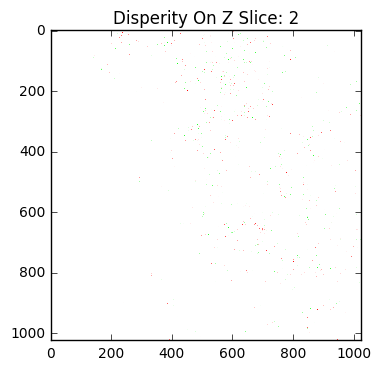

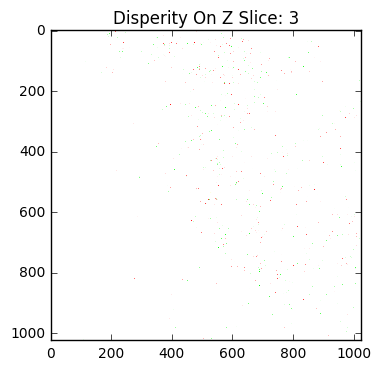

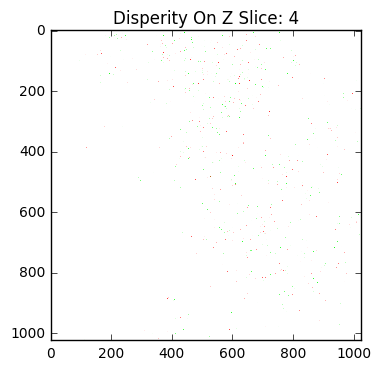




500  iteration test  2
	Initial Error:  8895.0
	Transform:
[0.9519573537187093, -0.016514387057642323, 0.026409263151808388, 0.012559058327132994, 0.9425256382791283, 0.13667724280104696, -0.028503407060328067, -0.13625591240702564, 0.9422392793655553, -1.798305281381782e-05, -1.7594346478382688e-05, -0.00011489654902256143]
	Final Error:  4481.0
	Error Reduction Ratio:  0.496233839236


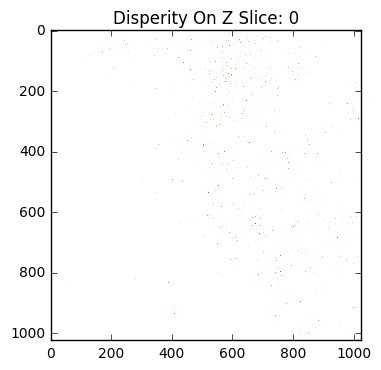

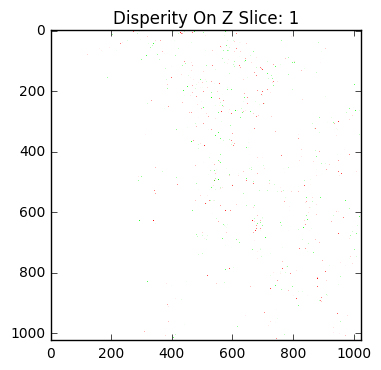

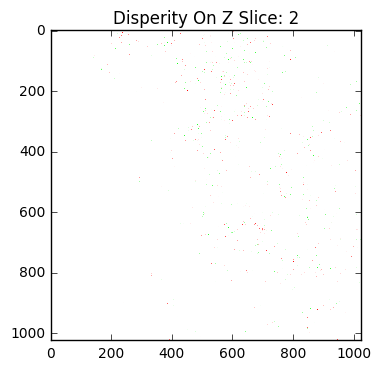

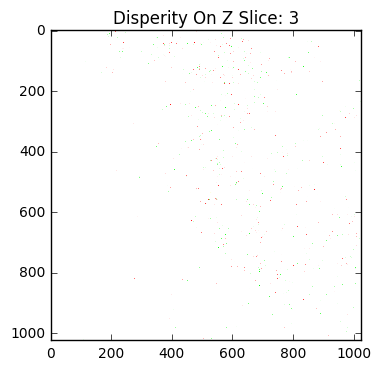

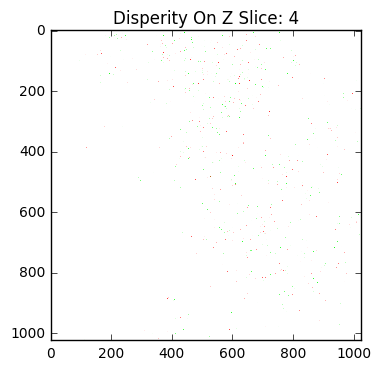

In [68]:
fullSimData = []
for iterations in (200, 300, 400, 500):
    testData = []
    for test in range(3):
        print iterations, ' iteration test ', test
        regImg, initialErr, finalErr, reductionRatio = executeTest(transformVolume,
                                                                   centroidVolume,
                                                                   iterations,
                                                                   verbose=True,
                                                                   display=True)
        print '\n\n'
        testData.append([initialErr, finalErr, reductionRatio])
    fullSimData.append(testData)

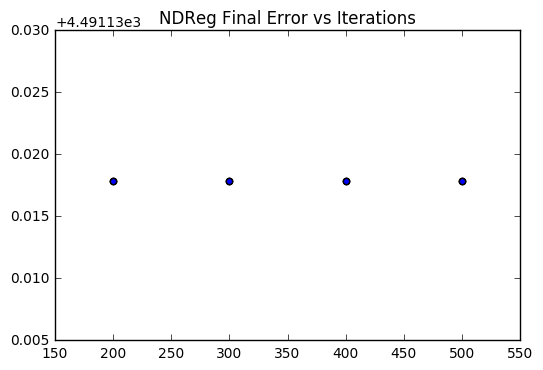

In [17]:
#display the full sim data
fig = plt.figure()
plt.title('NDReg Final Error vs Iterations')

scatterList = []
for trial in fullSimData:
    for test in trial:
        scatterList.append(test[1])
        
plt.scatter([200, 200, 200, 300, 300, 300, 400, 400, 400, 500, 500, 500], scatterList)
plt.show()

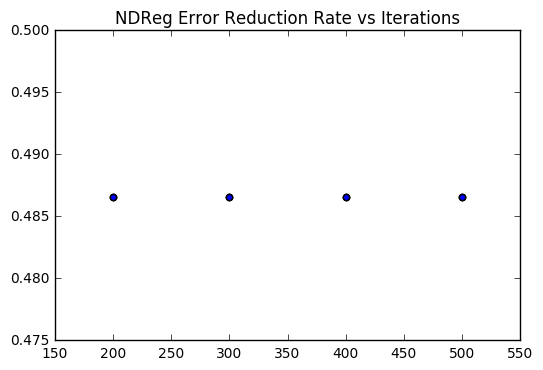

In [19]:
#display the full sim data
fig = plt.figure()
plt.title('NDReg Error Reduction Rate vs Iterations')

scatterList = []
for trial in fullSimData:
    for test in trial:
        scatterList.append(test[2])
        
plt.scatter([200, 200, 200, 300, 300, 300, 400, 400, 400, 500, 500, 500], scatterList)
plt.show()

It seems that, much like the binary mask registration, binary centroid registration is erroniously converging at ~48%. Additionally, this convergence seems to be independent of iterations. I would predict, bsed on these results, that the convergence would also be independent of initial results.

### 2. Tuning Error Intensity

Out of bounds fraction:  0.0
NDReg test with yaw displacement of:  0.0  radians
	Initial Error:  0.0
	Transform:
[1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
	Final Error:  0.0
	Error Reduction Ratio:  nan


/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:26: RuntimeWarning: invalid value encountered in double_scalars


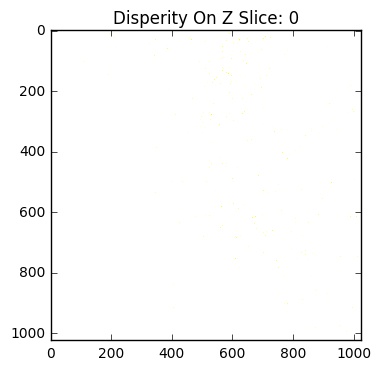

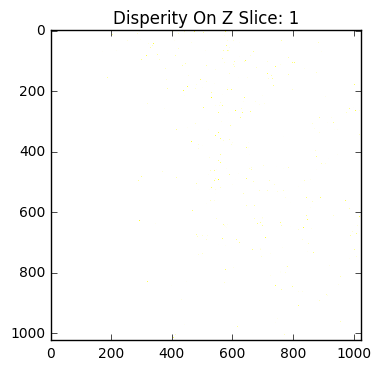

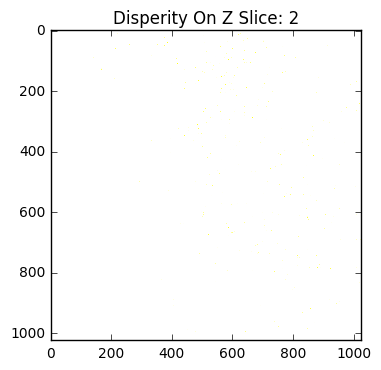

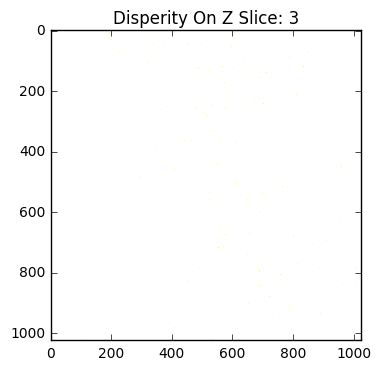

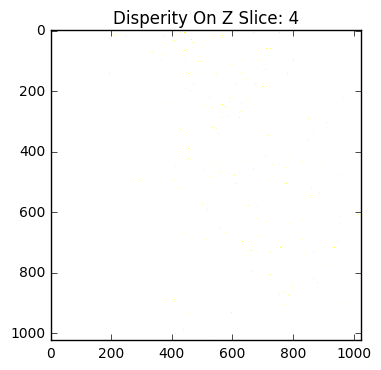




Out of bounds fraction:  0.00199794769287
NDReg test with yaw displacement of:  0.01  radians
	Initial Error:  8666.0
	Transform:
[1.0092571098923162, -0.10110236458896112, -0.0011972098501708637, 0.1034322293951314, 1.0125837825500272, 0.0033284787517996583, -0.07837127218071853, -0.06694865843383421, 1.0150751509322908, 1.449126192288325e-05, 2.9588297266964295e-05, -0.00013943488448769098]
	Final Error:  4481.0
	Error Reduction Ratio:  0.482921763213


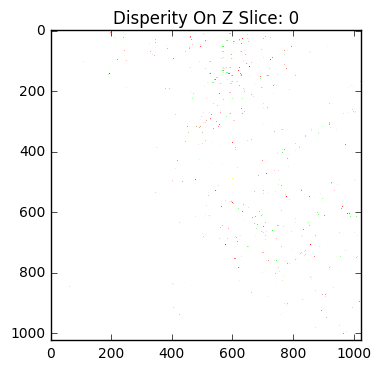

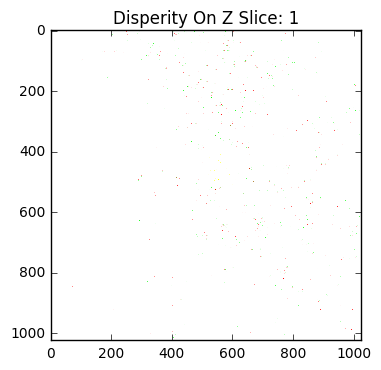

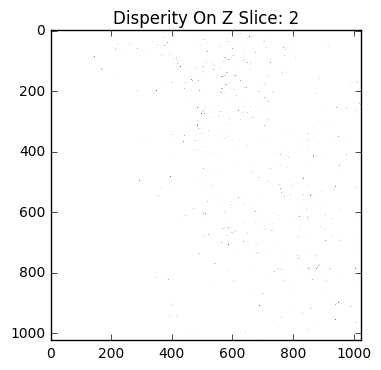

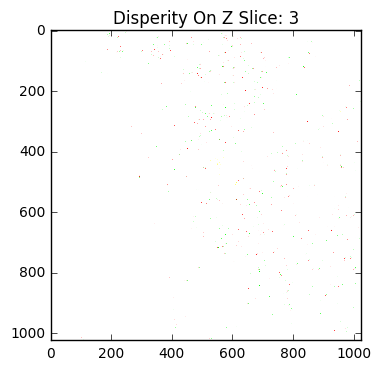

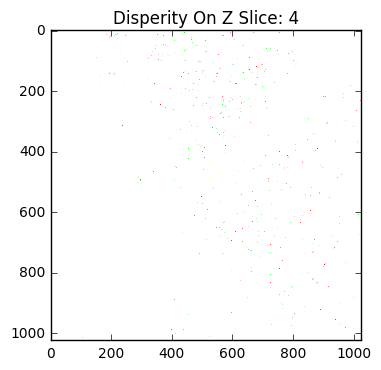




Out of bounds fraction:  0.00441551208496
NDReg test with yaw displacement of:  0.02  radians
	Initial Error:  8860.0
	Transform:
[1.0174272378148845, -0.09775990499566696, -0.03717506912249674, 0.12102822555965372, 1.0075374980858025, 0.0400917331813435, 0.13119250992234216, -0.05176225538814463, 1.0064010614217112, 1.2283586868562213e-05, 5.6128631988878434e-05, 6.453324182426118e-05]
	Final Error:  4481.45916387
	Error Reduction Ratio:  0.494191967961


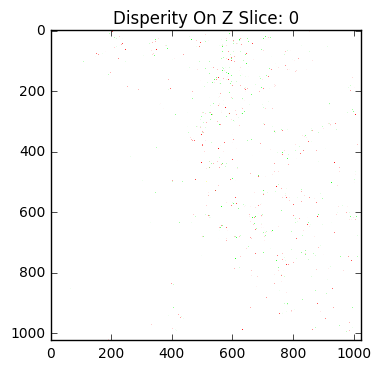

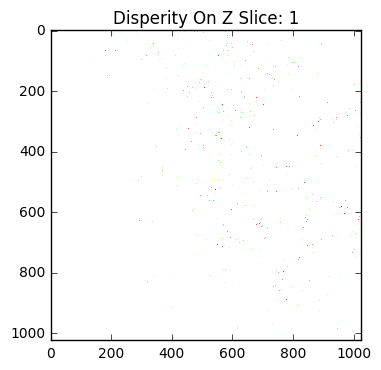

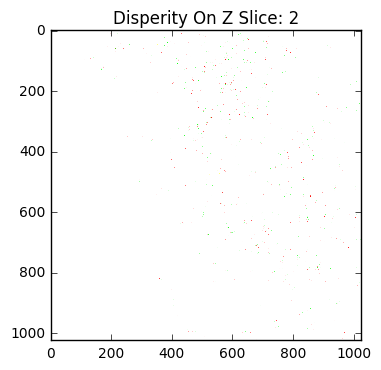

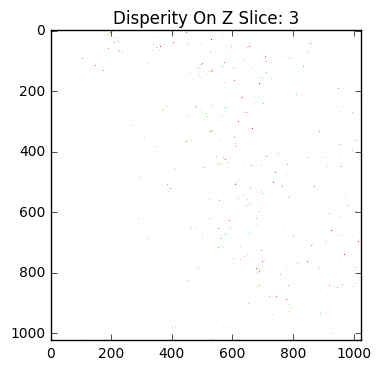

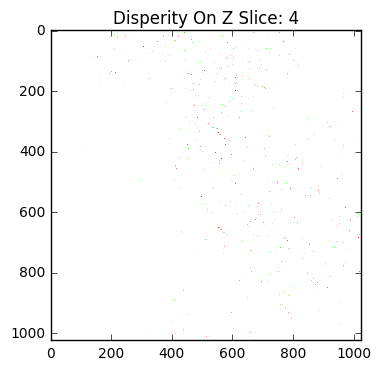




Out of bounds fraction:  0.00680255889893
NDReg test with yaw displacement of:  0.03  radians
	Initial Error:  8893.0
	Transform:
[1.0009811529252022, -0.06172913407721793, -0.05385560180101492, 0.06478711855453263, 1.0005979493526673, 0.057276115191039735, 0.050135228220020735, -0.06055937671453671, 1.0012458245276297, -6.094276511183286e-06, 4.138064401403309e-05, -7.11359235367048e-05]
	Final Error:  4632.53850786
	Error Reduction Ratio:  0.479080343207


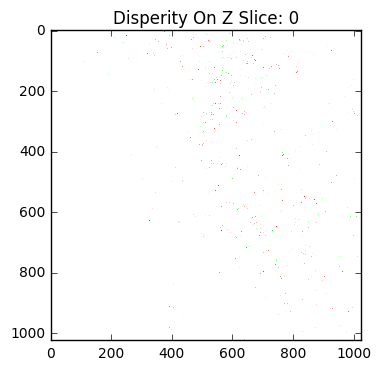

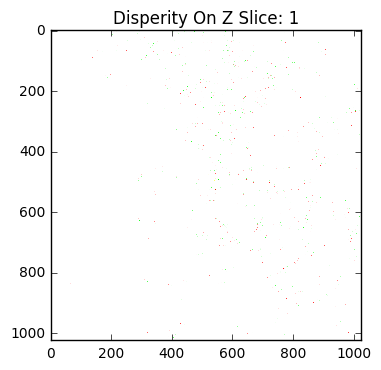

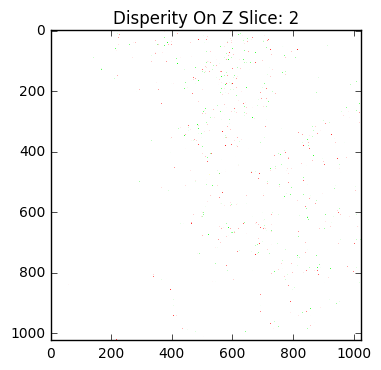

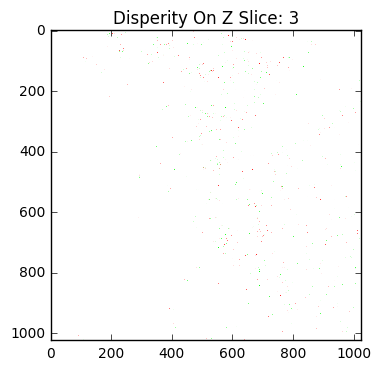

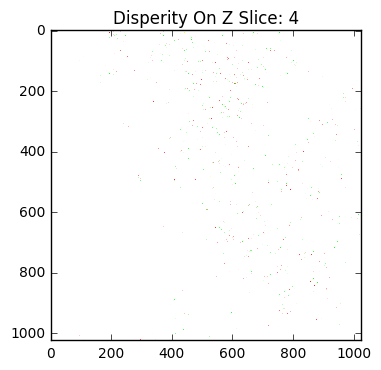




Out of bounds fraction:  0.00912094116211
NDReg test with yaw displacement of:  0.04  radians
	Initial Error:  8900.0
	Transform:
[1.0028471106672838, -0.038347654380189736, -0.09703660701435204, 0.035734309692545055, 1.007217117324555, -0.028735183142810237, 0.09802910184285868, 0.0251417788350602, 1.0031685597246014, 5.091446978439661e-06, 2.974671221617955e-05, -3.3226469973188824e-06]
	Final Error:  4481.0
	Error Reduction Ratio:  0.496516853933


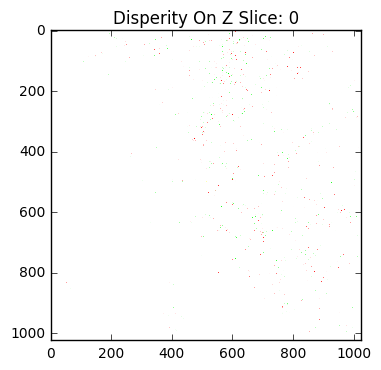

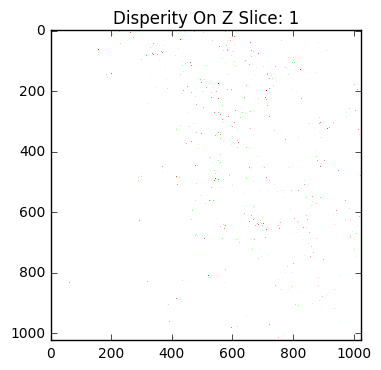

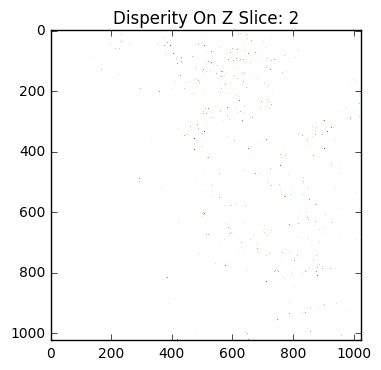

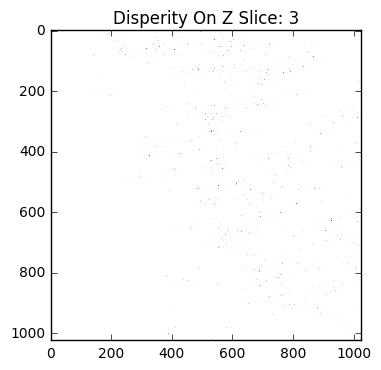

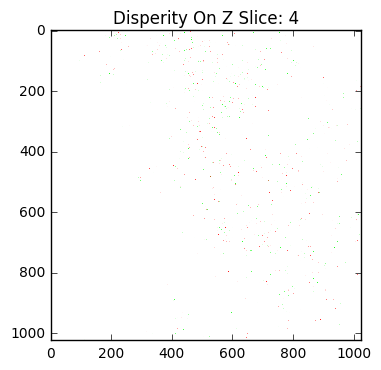




Out of bounds fraction:  0.0114212036133
NDReg test with yaw displacement of:  0.05  radians
	Initial Error:  8895.0
	Transform:
[0.9519573537187093, -0.016514387057642323, 0.026409263151808388, 0.012559058327132994, 0.9425256382791283, 0.13667724280104696, -0.028503407060328067, -0.13625591240702564, 0.9422392793655553, -1.798305281381782e-05, -1.7594346478382688e-05, -0.00011489654902256143]
	Final Error:  4481.0
	Error Reduction Ratio:  0.496233839236


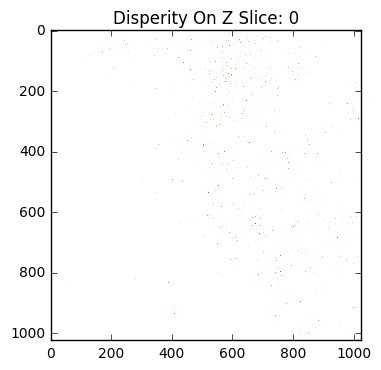

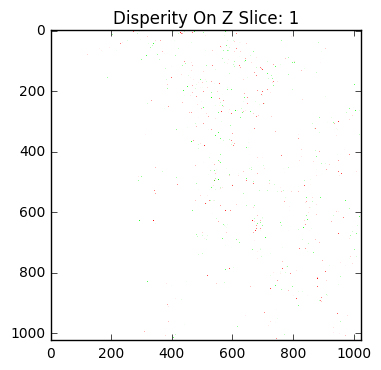

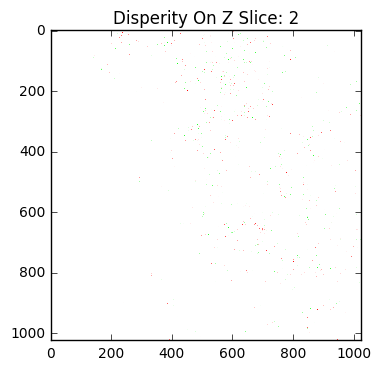

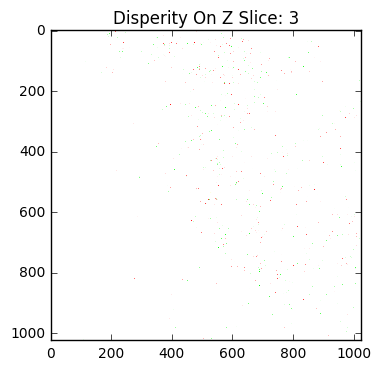

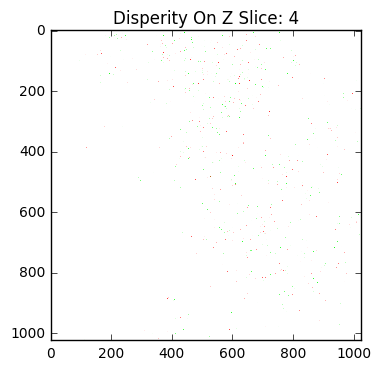

In [67]:
fullSimData = []
for i in range(6):
    transform = getTransform(pitch=0., yaw=i/100., roll=0., xT=0., yT=0., zT=0.)
    transformVolume = applyRigid(centroidVolume, transform, True)
    print 'NDReg test with yaw displacement of: ', i/100., ' radians'
    regImg, initialErr, finalErr, reductionRatio = executeTest(transformVolume, centroidVolume, 300, verbose=True, display=True)
    fullSimData.append([initialErr, finalErr, reductionRatio])
    print '\n\n'

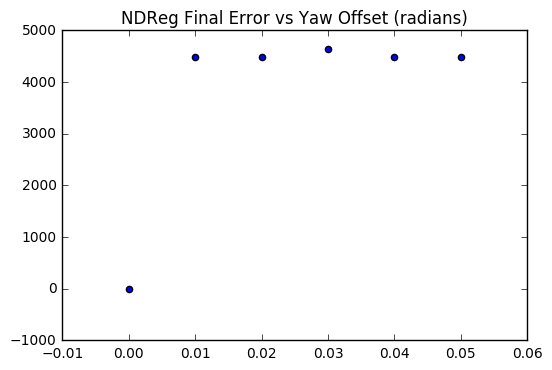

In [22]:
#display the full sim data
fig = plt.figure()
plt.title('NDReg Final Error vs Yaw Offset (radians)')

scatterList = []
for trial in fullSimData:
     scatterList.append(trial[1])
        
plt.scatter([0., .01, .02, .03, .04, .05], scatterList)
plt.show()

- Again, it seems like the initial error is not a factor in NDReg's matching ability. The same erronious convergence seems to be occurring regardless of yaw offset

- Based on the performance thus far, I believe that testing with the intuitively more difficult method 2 is redundant